<a href="https://colab.research.google.com/github/rezaghayedi/Traffic-Sign-Detection-and-Recognition/blob/main/src/traffic_sign_detection_and_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Traffic Sign Detection and Recognition


# 1.Introduction


## 1.1.System Overview
This project aims to develop a complete computer vision system for traffic sign detection and recognition. We use the GTSDB and GTSRB datasets to train a YOLOv8 model for object detection and a ResNet18 model for image classification. The system first detects traffic signs in real-world street images or videos using YOLOv8, and then classifies the cropped sign regions using a fine-tuned ResNet18 into one of 43 traffic sign categories. To better understand model performance, we also compare traditional machine learning models like SVM, KNN, and Random Forest on the same classification task. Finally, the system is tested on real video footage, and the predicted labels are overlaid frame by frame, generating an annotated video as the final output. The whole pipeline is designed to be practical, accurate, and modular.
Figure 1 shows the overall pipeline of the project.


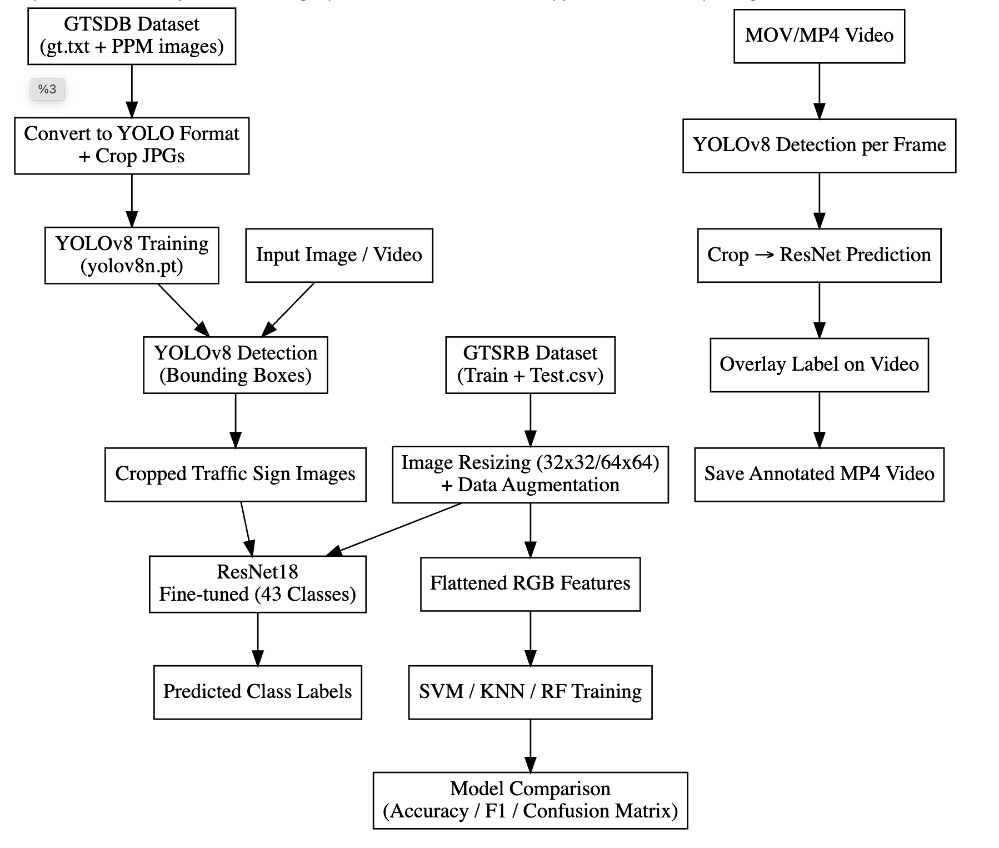

## 1.2.Problem Background & Motivation
In real-world driving environments, detecting and recognizing traffic signs quickly and accurately is a key challenge in computer vision. Traffic signs are often small, partially occluded, and vary in lighting, angle, and scale. Existing benchmark datasets like the German Traffic Sign Detection Benchmark (GTSDB) and the German Traffic Sign Recognition Benchmark (GTSRB) have provided strong foundations for research in this area (Houben et al. 2013; Stallkamp et al. 2011). However, most studies focus on either detection or classification in isolation.

This project proposes a complete pipeline that combines both stages: first detecting traffic signs using a YOLOv8 model trained on GTSDB, then classifying the cropped regions using a fine-tuned ResNet18 model on GTSRB. YOLOv8, released by Ultralytics (2023), is selected for its high performance in small-object detection and efficient deployment in image-based detection tasks.

To further evaluate the system, we compare deep learning classifiers with traditional machine learning models such as SVM, KNN, and Random Forest. This gives a broader understanding of performance trade-offs, especially in scenarios where computational resources are limited or interpretability is important.

Unlike many open-source examples that stop at classification, we tested our system on a real video recorded at a road junction near Bournemouth Lansdowne campus. The video was processed frame by frame, and predicted traffic sign labels were overlaid to generate an annotated output video. This step demonstrates how the model performs on real, unstructured input captured in a local environment.


## 1.3.Dataset Description
This project uses three types of datasets: one for object detection (GTSDB), one for classification (GTSRB), and a self-recorded real-world video for final system testing.


### 1.3.1. GTSDB – Detection Dataset
The German Traffic Sign Detection Benchmark (GTSDB) is used to train our YOLOv8 detection model. It contains over 900 high-resolution street images taken in real driving environments across Germany. Each image may contain one or more traffic signs, annotated with bounding box coordinates in a text file named gt.txt.

We converted this annotation file into YOLOv8 format by extracting each bounding box and calculating its normalized center coordinates and dimensions. The original .ppm images were also converted to .jpg format for compatibility with OpenCV and YOLO training. The images were then split into training and testing folders for model training and validation.

### 1.3.2. GTSRB – Classification Dataset
The German Traffic Sign Recognition Benchmark (GTSRB) is used to train our ResNet18 classifier. This dataset contains over 50,000 images of cropped and labeled traffic signs belonging to 43 distinct classes. Each image represents a single traffic sign, originally sized around 30×30 to 100×100 pixels.

In our pipeline, all images were resized to 32×32 or 64×64 and normalized for PyTorch training. Data augmentation techniques such as random rotation, color jittering, and horizontal flipping were applied to increase model robustness. The training and testing sets were based on the default folder structure and the provided Test.csv file.


### 1.3.3. Real-World Video – Bournemouth Lansdowne Junction
To evaluate how well the system generalizes to real-world scenarios, we recorded a video at a road junction near the Lansdowne campus in Bournemouth. The video was captured using a mobile device and saved in .MP4 format. It was then processed frame-by-frame using our trained detection and classification models.

Each frame was passed through the YOLOv8 detector to locate potential traffic signs. The cropped regions were then classified by the ResNet18 model, and the predicted labels were overlaid on the original frame. The processed frames were finally stitched into a new annotated video using MoviePy.


# 2.Methodology

## 2.1.Deep Learning Model Data Preparation & Preprocessing
To prepare the data for this project, we worked with three sources: the GTSDB dataset for object detection, the GTSRB dataset for classification, and a real-world traffic video recorded near the Lansdowne junction in Bournemouth.


### 2.1.1GTSDB (for YOLOv8)
The raw GTSDB dataset includes .ppm format images and one annotation file called gt.txt. Each line in the annotation contains the image filename, bounding box coordinates, and class ID. We wrote a script to:

Convert each bounding box into YOLO format: [class_id xc yc w h] with normalized values

Save the converted label files into separate .txt files

Convert .ppm images into .jpg and copy them into YOLO’s train/ and test/ folders

We also created a data.yaml file to define the dataset structure for YOLOv8 training.

### 2.1.2 GTSRB (for ResNet18)
The GTSRB dataset already comes with cropped traffic sign images, organized by class folders. We resized all images to 64×64 and applied several standard augmentations using PyTorch transforms, including:

Random rotation

Color jittering

Random horizontal flipping

We then created a custom GTSRBDataset class for PyTorch and used DataLoader to split the data into training and validation sets. Labels were stored as class IDs (0 to 42).

First we need to download GTSRB dataset from google drive:

In [ ]:
!gdown --fuzzy "https://drive.google.com/uc?id=1HfmPX_O19iyQoxHphYY7XHOyvbeyKbAh"
!unzip -q archive.zip -d GTSRB

Downloading...
From (original): https://drive.google.com/uc?id=1HfmPX_O19iyQoxHphYY7XHOyvbeyKbAh
From (redirected): https://drive.google.com/uc?id=1HfmPX_O19iyQoxHphYY7XHOyvbeyKbAh&confirm=t&uuid=d65d712b-4bf4-4ec0-8cf0-2be9a1b0a818
To: /content/archive.zip
100% 642M/642M [00:02<00:00, 239MB/s]


In [ ]:
!ls GTSRB

meta  Meta  Meta.csv  test  Test  Test.csv  train  Train  Train.csv


In [ ]:
!pip install ultralytics --upgrade

from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 35.2 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!pip install torch torchvision matplotlib tqdm

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader, random_split
import numpy as np
from PIL import Image
import seaborn as sns
import pandas as pd
from google.colab import files
import subprocess
from moviepy.editor import ImageSequenceClip
from torchvision.models import resnet18
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import pickle

/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':



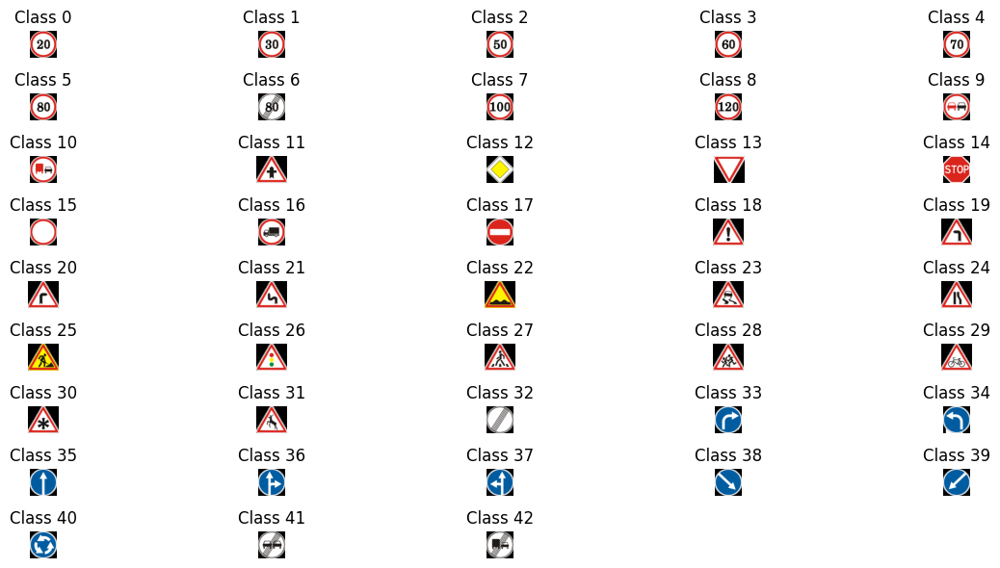

In [ ]:
meta_dir = "/content/GTSRB/Meta"
plt.figure(figsize=(12, 6))
for i in range(43):
    img_path = os.path.join(meta_dir, f"{i}.png")
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(9, 5, i+1)
    plt.imshow(img)
    plt.title(f"Class {i}")
    plt.axis('off')
plt.tight_layout()
plt.show()


Applied histogram equalization to the red channel (to improve contrast)

Used gamma correction to brighten dark scenes

Each frame was then passed through the YOLOv8 detector. If any bounding boxes were found, the cropped regions were sent into the ResNet18 model for classification. The predictions were drawn back onto the frame using OpenCV, and finally the frames were reassembled into a new annotated video.




### 2.1.4Running Instructions
This notebook is designed to be run in **Google Colab**. Before running, please follow the steps below to ensure all paths and data files are correctly configured:
✅ Step 1: Mount Google Drive
At the beginning of the notebook, run the following cell to mount your Google Drive
✅ Step 2: Upload Project Files to Your Drive
✅ Step 3: Update Paths in the Notebook
✅ Step 4: Install Required Libraries
✅ Step 5: Run Cells Step by Step

* from ultralytics import YOLO: The YOLO models are  imported through this command from the ultralytics package. Classification, segmantation, object detection. is carried out through the YOLO midel, as YOLOv8 is used in this notebook report.

* import os: This imports os module, a Python built-in module for collaborating wuth the operating system. This includes manipulating dictory, and file in the system.

* Import cv2: OpenCv processes videos and images, generate functions anf tools used in processing images and real-time computer vision problems. It is imported using the command'import cv2' and is also known as a computer vvision library.

!pip install torch torchvision matplotlib tqdm installs the necessary Python libraries in to the Python environment. The libraries include TorchVision, Matplotlib, TQDM, Torch known as PyTorch.

* torch: is a generally used open-source library for deep learning applications, building and training neural networks, and also tools for GPU acceleration, linesr algebra, reshaping and slicing, braodcasting, reduction operation, and arithmetic operations.

* torchvision: it is used for computer vision tasks, privides datasets, image transformation, and also pre-trained models which includes VGG, MobileNet, and ResNet.


The code in the following cell was required only once at the beginning of the project to extract the dataset into the designated folder. Since the dataset has already been successfully unzipped, rerunning this cell is no longer necessary.

To avoid redundant processing and the risk of overwriting existing files, the code has been commented out. This preserves it for reference or future use while preventing unnecessary execution.

In [ ]:
# import zipfile

# zip_file_path = '/content/drive/MyDrive/CV project 2025/GTSDB Dataset/GTSDB_Dataset.zip'

# extract_folder = '/content/drive/MyDrive/CV project 2025/GTSDB Dataset/Unzip'

# os.makedirs(extract_folder, exist_ok=True)

# with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_folder)

Download GTSDB dataset from google drive:

In [ ]:
!gdown --fuzzy "https://drive.google.com/uc?id=13JIMRCWMdDMK-LloLTm3qWyonfkjA09b"
!unzip -q GTSDB_Dataset.zip -d GTSDB

Downloading...
From (original): https://drive.google.com/uc?id=13JIMRCWMdDMK-LloLTm3qWyonfkjA09b
From (redirected): https://drive.google.com/uc?id=13JIMRCWMdDMK-LloLTm3qWyonfkjA09b&confirm=t&uuid=ceef6685-6907-4cfa-be76-5abf3cb5673e
To: /content/GTSDB_Dataset.zip
100% 1.73G/1.73G [00:24<00:00, 69.9MB/s]


In [ ]:
!ls GTSDB

gt.txt	TestIJCNN2013  TrainIJCNN2013


base_dir: is known as a base directory of the project. It is a starting path for accessing the file content GTSDB, resources, and subdirectories in the project notebook.The files are built relatively to the base directory, which makes the code smaller and uses dynamic file paths.

* for split in ["train", "test"]: This splits the GTSDB dataset into parts in machine learning, as the training images, and the testing images.

* os.makedirs: Is a powerful Python function applied to creating directories. It is a part of the os module, which gives the functions for effective collaboration with the operating system. The exist_ok=True ia an argument that avoids any error from being raised.



In [ ]:
base_dir = "/content/GTSDB_YOLO"

for split in ["train", "test"]:
    os.makedirs(base_dir + "/images/" + split, exist_ok=True)
    os.makedirs(base_dir + "/labels/" + split, exist_ok=True)

* gt_path is known as the ground truth path in computer vision. It accesses file path used to store ground truth which is the labeled data for training, evaluating and validating the models in the project. It also loads data files, annotations which are also used for training and evaluation.

* train_img_dir: specifies the directory path "/content/drive/MyDrive/CV project 2025/GTSDB Dataset/Unzip/TrainIJCNN2013/TrainIJCNN2013" where all the training images are located. It is given to libraries in the Python notebook to load the training images needed for preprocessing before training.

* test_img_dir: specifies tthe directory path to the folder for test images "/content/drive/MyDrive/CV project 2025/GTSDB Dataset/Unzip/TrainIJCNN2013/TestIJCNN2013Download". It is used to load the test images and perform evaluation on them through the trained model.

In [ ]:
gt_path = "/content/GTSDB/gt.txt"

train_img_dir = "/content/GTSDB/TrainIJCNN2013/TrainIJCNN2013"
test_img_dir = "/content/GTSDB/TestIJCNN2013/TestIJCNN2013Download"

* train_output_dir: training output directory is the directory for preprocessed images, and the model checkpoints, which is gotten and stored during the training phase. It keeps the loss, and accuracy of the training process.

* test_output_dir: testing output directory is the output produced during the testing phase and stored. It saves predictions, stores evaluation and keeps the loss, and accuracy of the testing process for analysis.

* train_label_dir: training label directory is used for storing the train dataset ground truth labels and in some cases annotation.

* test_label_dir: test label directory is used for storing the test dataset ground truth labels and also annotation. It loads the actual test data labels for model evaluation. It compares the predictions of the model during the testing phase with the ground truth labels.

In [ ]:
train_output_dir = base_dir + "/images/train"
test_output_dir = base_dir + "/images/test"
train_label_dir = base_dir + "/labels/train"
test_label_dir = base_dir + "/labels/test"


from tqdm import tqdm imports the tqdm module, this gives an extensible and fast progress bar for Python program.

This code cell applies data preprocessing pipeline to the GTSRB dataset, it reads or detects the image and process the image file labels and paths. It also perrforms cropping, resizing and transformation, and saves the processed images to the output directory.
The file is splitted into parts, transformed and read using OpenCV and then futher preprocessed. The file is then replaced to show that it has been proccessed  to the specified output directory.
* xc: represents the X-coordinate of the bounding box centre.

* yc: represents the Y-coordinates of bounding box center.

* bw: represents the bounding box width.

* bh: represents the bounding box height.
 The label file is saved after preprocessing as processed image and it is then written into the file.

In [ ]:
from tqdm import tqdm

def process_data(gt_path, img_dir, output_img_dir, label_dir):
    with open(gt_path, 'r') as f:
        lines = f.readlines()

    for line in tqdm(lines, desc=f"Processing {os.path.basename(img_dir)}", unit="image"):
        parts = line.strip().split(';')
        filename, x1, y1, x2, y2, class_id = parts
        x1, y1, x2, y2, class_id = map(int, [x1, y1, x2, y2, class_id])

        src_path = os.path.join(img_dir, filename)
        if not os.path.exists(src_path):
            continue

        img = cv2.imread(src_path)
        if img is None:
            continue
        h, w = img.shape[:2]

        out_filename = filename.replace(".ppm", ".jpg")
        out_img_path = f"{output_img_dir}/{out_filename}"
        cv2.imwrite(out_img_path, img)

        xc = (x1 + x2) / 2 / w
        yc = (y1 + y2) / 2 / h
        bw = (x2 - x1) / w
        bh = (y2 - y1) / h

        label_path = label_dir + "/" + out_filename.replace(".jpg", ".txt")
        with open(label_path, 'w') as f_out:
            f_out.write(f"0 {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n")


process_data is used in data preprocessing, to Prepare the images, for model training, and evaluation. It involves normalization, augmentation, resizing, data spliting, data loading and return the processed image for model training.

In [ ]:
process_data(gt_path, train_img_dir, train_output_dir, train_label_dir)
process_data(gt_path, test_img_dir, test_output_dir, test_label_dir)

Processing TestIJCNN2013Download: 100%|██████████| 852/852 [00:04<00:00, 199.12image/s]


data_yaml is a spring visualizaton of a YAML configuration file used to define the paths for the GTSDB training and validation dataset, that is a folder that contains GTSDB training images, and another folder that contains the validation images.

* with open(): opens the file "/content/GTSDB_YOLO/data.yaml" and f.write(): is used to write all the contents od the data_yaml to the file. Other parts of the GTSDB project program are able to access the saved to disc YAML configuration.


In [ ]:
data_yaml = """
path: /content/GTSDB_YOLO
train: images/train
val: images/test
names:
  0: traffic_sign
"""

with open("/content/GTSDB_YOLO/data.yaml", "w") as f:
    f.write(data_yaml)

This initializes the YOLOv8 model for object detection, from the Ultralytics YOLOv8 library. It loads the pre-trained model to create a new YOLO model for thr data training.
The file is stored Pytorch format(.pt).

In [ ]:
model = YOLO("yolov8n.pt")

model.train(): Is a method by YOLO class in Ultralytics YOLO library. It deploys the YOLO model  training process using certain parameters.

* data: The dataset configuration file path is specified. The configuration contains the training and training datasets.

* The number of trainging epochs is 25, The size 640 is for 640 by 640 resolution, batch is 16 which represents the number of processed images in a single training step. catch is set to true in order to preload images into memory which
increases the speed in  training.
The data is trained, while the model is trained, before catching and then the outputs are generated.


In [ ]:
model.train(
    data="/content/GTSDB_YOLO/data.yaml",
    epochs=25,
    imgsz=640,
    batch=16,
    cache=True,
    name="yolo_gtsdb_detector"
)


Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/GTSDB_YOLO/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_gtsdb_detector, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plot

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x793c052abc20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

The following cell is for loading a pre-trained YOLO model and evaluating its performance. The model—originally trained during the implementation phase—is now loaded directly from a designated path in Google Drive to save time and avoid retraining. Once loaded, the model is validated on a separate dataset to generate evaluation metrics, which provide insights into how well it generalizes to unseen data for object detection tasks.

In [ ]:
# Load the trained YOLO model:
# Option 1: Load directly from local runs folder (if you trained the model in this notebook)
# model = YOLO("/content/runs/detect/yolo_gtsdb_detector/weights/best.pt")

# Option 2: Load from Google Drive (if you have saved the trained model there)
!gdown --fuzzy "https://drive.google.com/uc?id=1hPKc-xkz9dQoH6xaNaUqQ7dWZzhf6qwu"
model = YOLO("/content/best.pt")

# Validate the model on the validation set and print evaluation metrics
metrics = model.val()
print(metrics)


Downloading...
From: https://drive.google.com/uc?id=1hPKc-xkz9dQoH6xaNaUqQ7dWZzhf6qwu
To: /content/best.pt
100% 6.22M/6.22M [00:00<00:00, 36.6MB/s]
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2891.1±1484.1 MB/s, size: 388.8 KB)
val: Scanning /content/GTSDB_YOLO/labels/test.cache... 295 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 295/295 593.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 3.8it/s 5.0s
                   all        295        295    0.00948    0.00339   0.000497    0.00023
Speed: 2.2ms preprocess, 3.3ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/runs/detect/val2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric 

import random is an in-built Python module, which gives certain functions for generating and performing random operations.

* test_dir: This repesents the path 'content/GTSDB_YOLO/images/test' to the directory where images for sampling are present.

* image_files: represents the image names contained in the test_dir.

* sample_image = random.sample: is a function that allows random selection in the list of images(image_files) creating a subset of images. This is done for testing and validation of the dataset.

In [ ]:
test_dir = '/content/GTSDB_YOLO/images/test'
image_files = [f for f in os.listdir(test_dir) if f.endswith('.jpg')]

sample_images = random.sample(image_files, 10)


import matplotlib.pyplot as plt: is a popular Python library for generating animated, and inactive visualization. pyplot provide MATLAB-like for generating visualization, it creates easier and simpler plots.This includes bar charts, line plots, scatter plots, and histograms.

In [ ]:
def show_image(img, title='', size=(8, 6)):
    plt.figure(figsize=size)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

cropped_traffic_signs are the variables that contain cropped traffic sign images.

The traffic signs images are detected using enumerate function to loop the image collecton,nimg_path = os.path.join()  creates the full path of the file by the combination of the image name and dictionary path. YOLOv8 is applied on the images to generate detection result which contains bounding box. The original images are copied in order to create the bounding boxes on them.
x1,y1,x2,y2 get the bounding box coordinates from the corners of the box object and then transforms them into integers. Images with bounding boxex are displayed with cropped detected traffic signs.


image 1/1 /content/GTSDB_YOLO/images/test/00175.jpg: 384x640 (no detections), 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


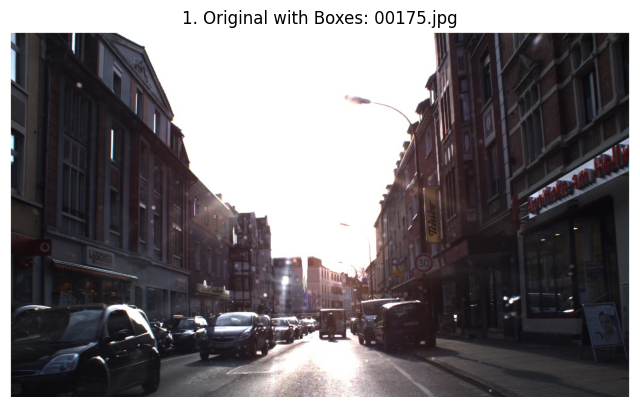


image 1/1 /content/GTSDB_YOLO/images/test/00181.jpg: 384x640 (no detections), 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


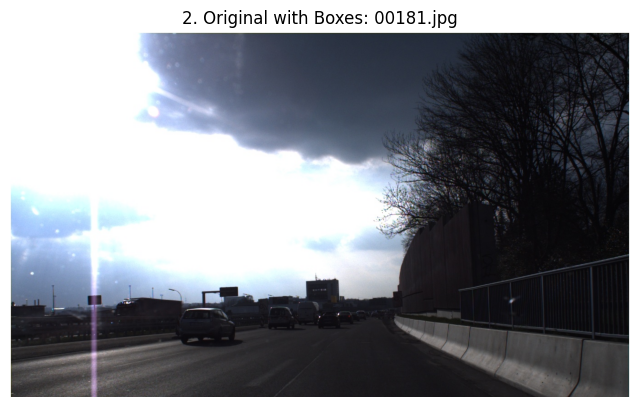


image 1/1 /content/GTSDB_YOLO/images/test/00095.jpg: 384x640 1 traffic_sign, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


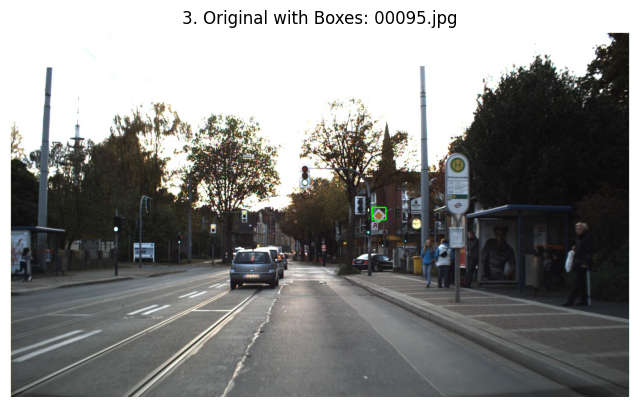

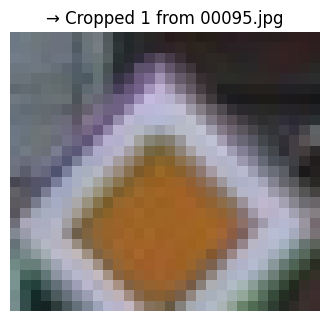


image 1/1 /content/GTSDB_YOLO/images/test/00271.jpg: 384x640 2 traffic_signs, 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


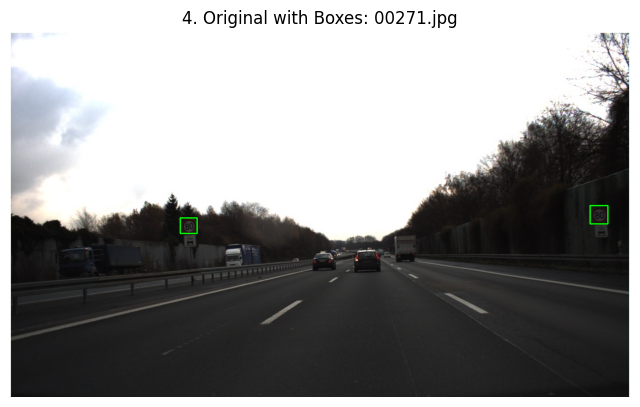

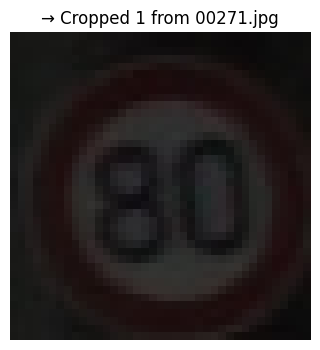

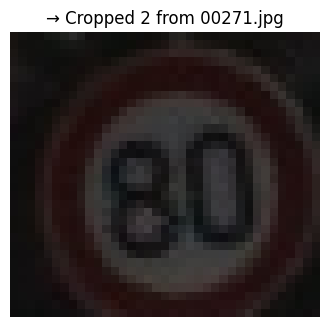


image 1/1 /content/GTSDB_YOLO/images/test/00114.jpg: 384x640 1 traffic_sign, 10.3ms
Speed: 4.8ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


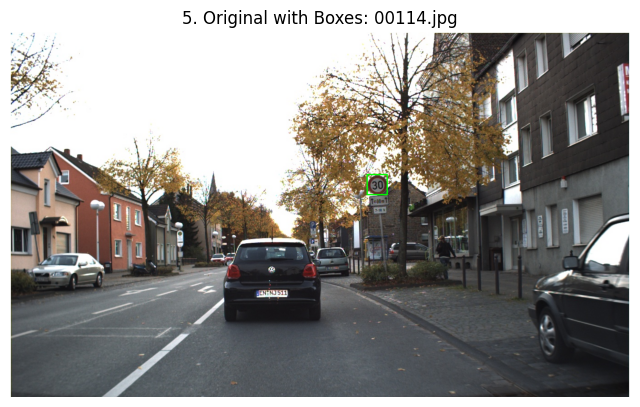

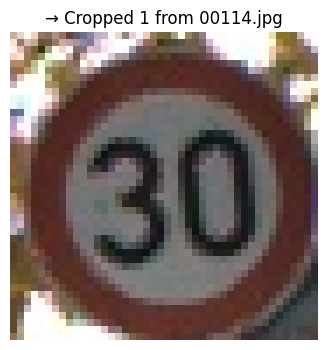


image 1/1 /content/GTSDB_YOLO/images/test/00009.jpg: 384x640 2 traffic_signs, 7.8ms
Speed: 3.1ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


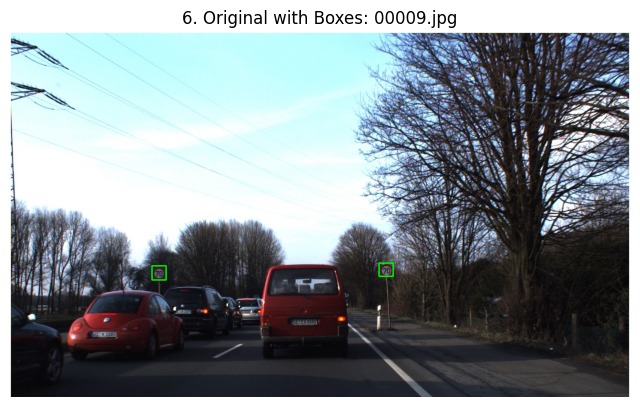

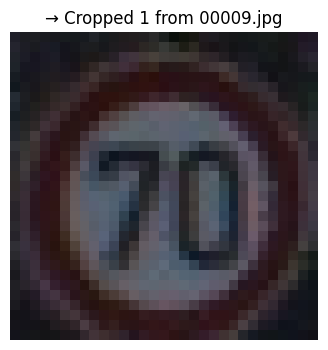

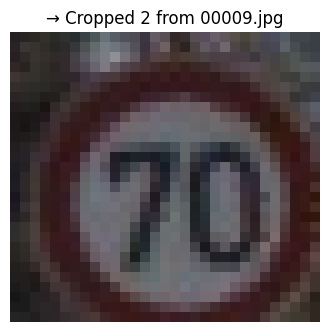


image 1/1 /content/GTSDB_YOLO/images/test/00236.jpg: 384x640 (no detections), 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


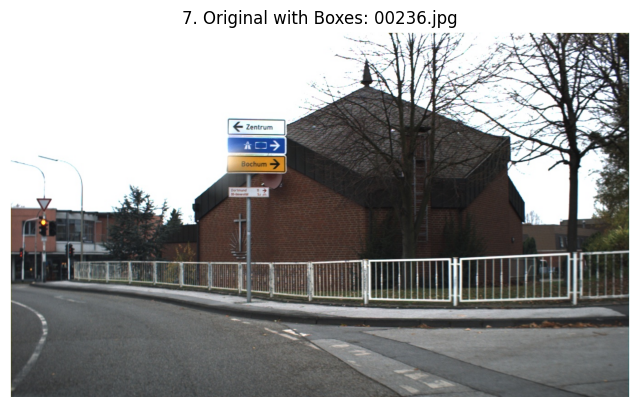


image 1/1 /content/GTSDB_YOLO/images/test/00205.jpg: 384x640 1 traffic_sign, 7.8ms
Speed: 3.2ms preprocess, 7.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


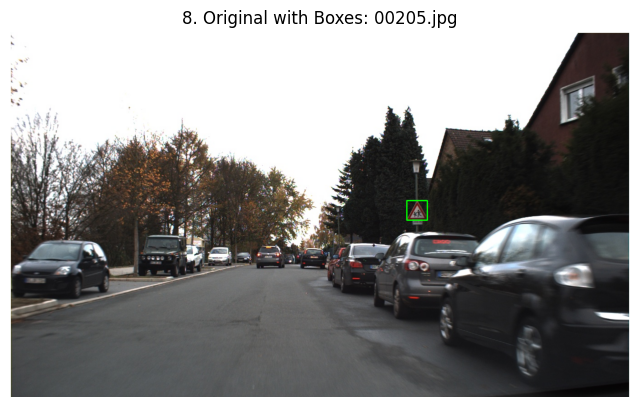

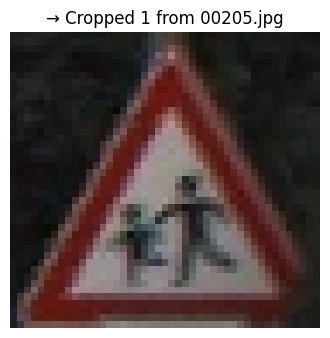


image 1/1 /content/GTSDB_YOLO/images/test/00016.jpg: 384x640 (no detections), 7.7ms
Speed: 3.2ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


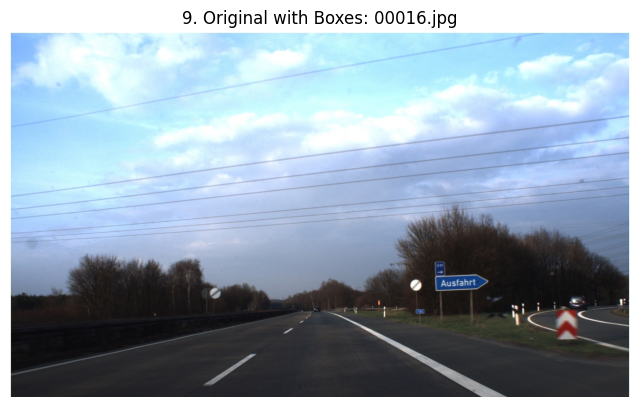


image 1/1 /content/GTSDB_YOLO/images/test/00288.jpg: 384x640 1 traffic_sign, 9.3ms
Speed: 4.3ms preprocess, 9.3ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


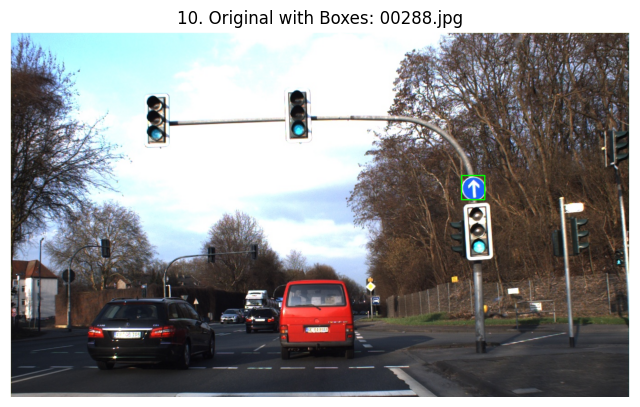

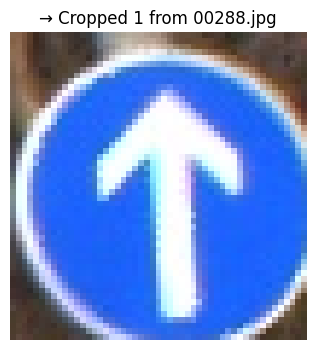

In [ ]:
cropped_trrafic_signs = []

for idx, img_name in enumerate(sample_images, 1):
    img_path = os.path.join(test_dir, img_name)
    img = cv2.imread(img_path)

    results = model(img_path)[0]

    img_with_boxes = img.copy()
    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

    show_image(img_with_boxes, title=f"{idx}. Original with Boxes: {img_name}")

    for j, box in enumerate(results.boxes, 1):
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cropped = img[y1:y2, x1:x2]
        cropped_trrafic_signs.append(cropped)
        show_image(cropped, title=f"→ Cropped {j} from {img_name}", size=(4, 4))

The traffic signs are detected and cropped and then displayed with the size (4,4) after iterating.

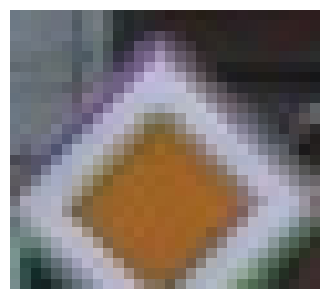

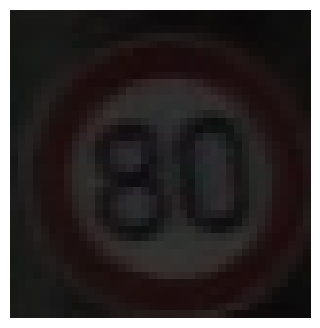

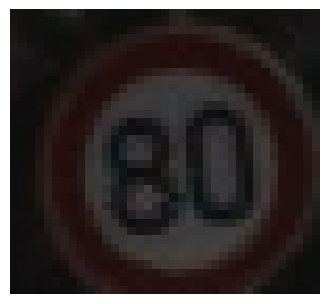

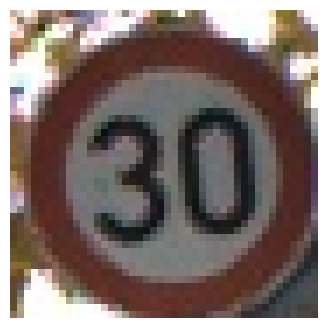

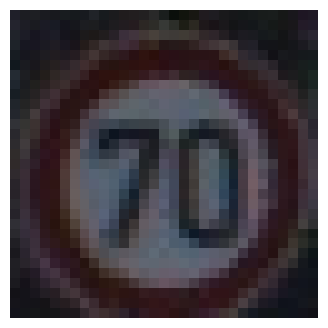

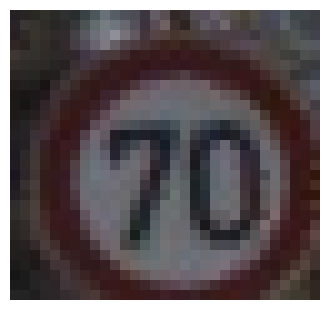

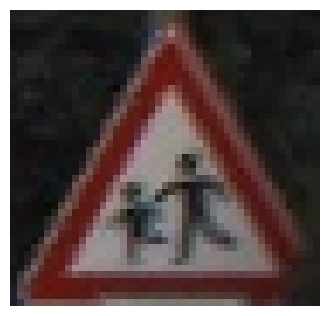

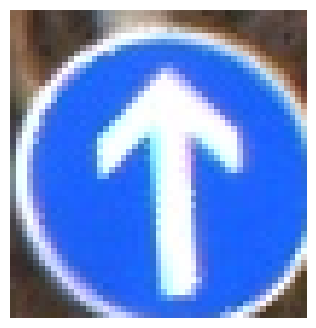

In [ ]:
for im in cropped_trrafic_signs:
  show_image(im, size=(4,4))

Object detection is performed on the images, and then the results are saved to the local path. The pre-trained YOLOv8 model performs object detection on an image(30.png) located in the drive. The generated results are saved to the loval path.

In [ ]:
# test on the image from local path:
# result will be saved to: runs/detect/predict
model = YOLO('/content/best.pt')

!gdown --fuzzy "https://drive.google.com/uc?id=11hRuMrjEgZNrdYlelLVf0lz-sQUrAXhT"

results = model.predict(source="/content/30.png", save=True, conf=0.25)

Downloading...
From: https://drive.google.com/uc?id=11hRuMrjEgZNrdYlelLVf0lz-sQUrAXhT
To: /content/30.png
100% 291k/291k [00:00<00:00, 4.75MB/s]

image 1/1 /content/30.png: 416x640 1 traffic_sign, 63.6ms
Speed: 4.8ms preprocess, 63.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
Results saved to /content/runs/detect/predict


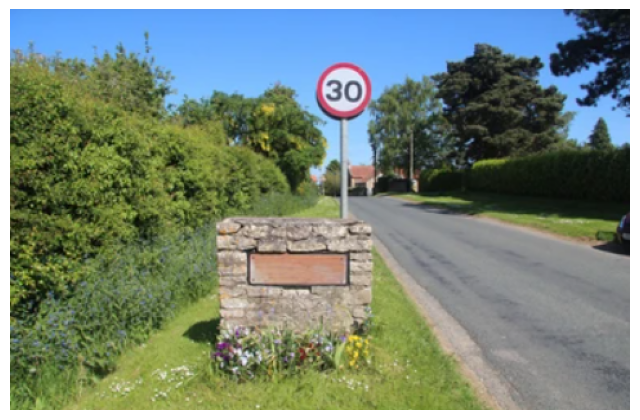

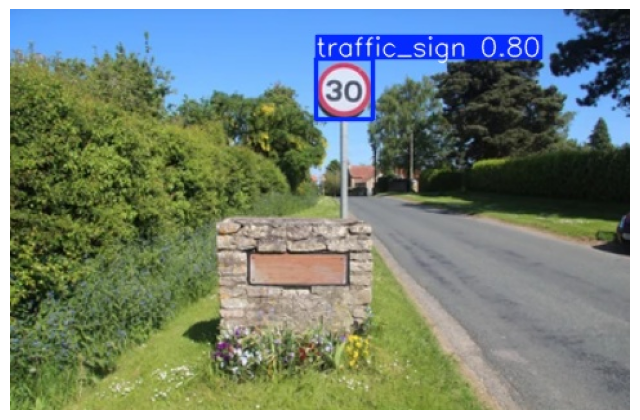

In [ ]:
test_30km = cv2.imread("/content/30.png")
prediction_test_30km = cv2.imread("/content/runs/detect/predict/30.jpg")
show_image(test_30km)
show_image(prediction_test_30km)

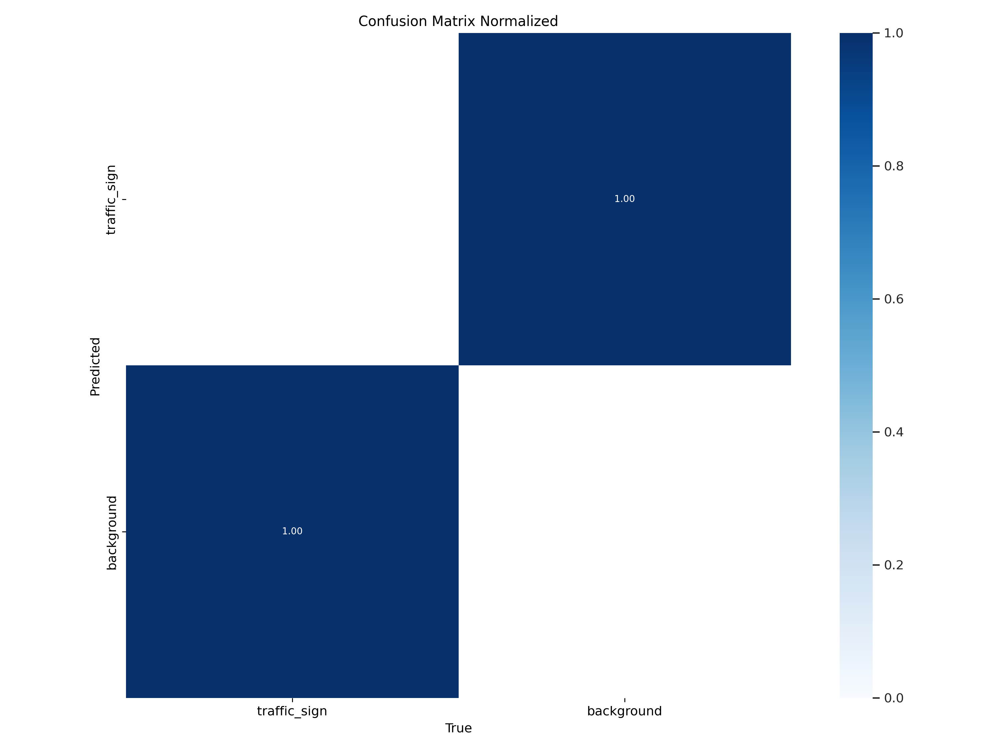

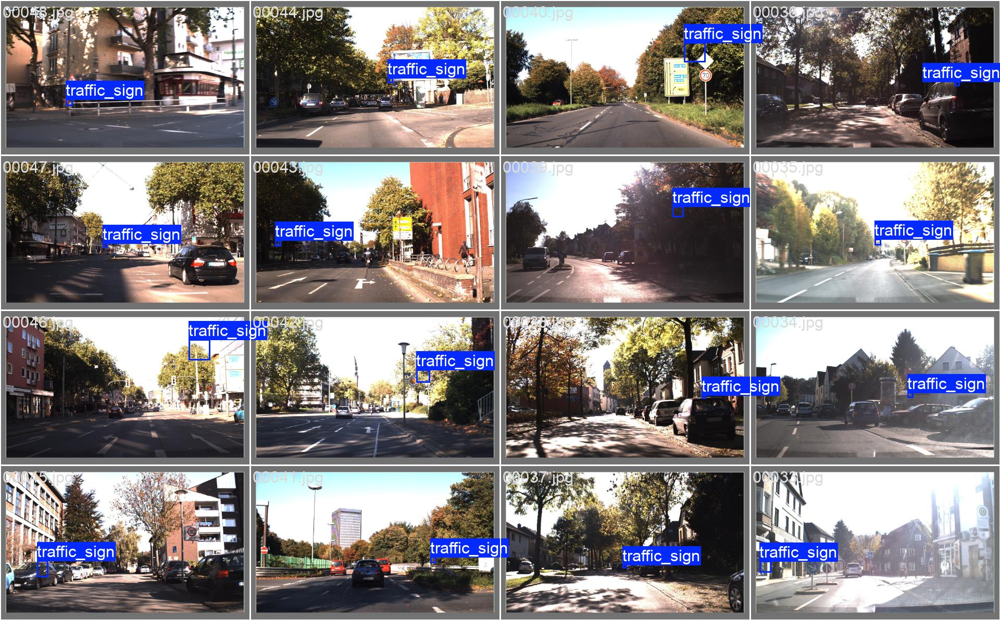

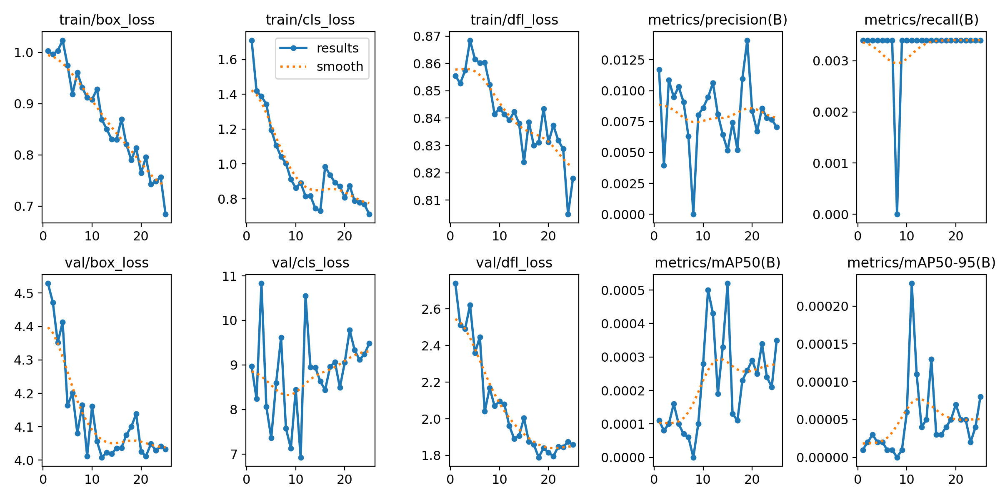

The normalized confusion matrix above shows that the YOLO-based detector perfectly distinguished between traffic sign regions and background in the validation set, with 100% accuracy in both classes. Each true traffic sign was correctly classified as a traffic sign, and all background regions were correctly identified as non-signs.

While this result looks ideal, it's important to interpret it with caution. In object detection, especially with YOLO, confusion matrices can sometimes appear perfect in simplified validation sets—especially if:

* The test images are visually clean or sampled directly from the training distribution

* The number of background samples is limited or unbalanced

* The bounding box labels are manually curated or trimmed

Moreover, this binary confusion matrix only reflects objectness confidence and not the correctness of sign classification (i.e. which type of sign it is). For real-world deployment, further evaluation should include:

* Intersection-over-Union (IoU) scores for detection overlap

* Multi-class confusion matrix for classification stages

* Video-based consistency testing with motion and blur

Still, this result shows that the object detection stage is working as expected, providing reliable cropped inputs to the classification model. It ensures that the pipeline is not missing signs, which is essential for safety-critical applications like driving assistance systems.

In [ ]:
!zip -r yolo_runs.zip runs/

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/val/ (stored 0%)
  adding: runs/detect/val/val_batch1_pred.jpg (deflated 10%)
  adding: runs/detect/val/PR_curve.png (deflated 29%)
  adding: runs/detect/val/P_curve.png (deflated 22%)
  adding: runs/detect/val/val_batch2_pred.jpg (deflated 7%)
  adding: runs/detect/val/val_batch1_labels.jpg (deflated 10%)
  adding: runs/detect/val/val_batch2_labels.jpg (deflated 7%)
  adding: runs/detect/val/confusion_matrix.png (deflated 37%)
  adding: runs/detect/val/val_batch0_labels.jpg (deflated 10%)
  adding: runs/detect/val/confusion_matrix_normalized.png (deflated 37%)
  adding: runs/detect/val/val_batch0_pred.jpg (deflated 10%)
  adding: runs/detect/val/R_curve.png (deflated 30%)
  adding: runs/detect/val/F1_curve.png (deflated 32%)
  adding: runs/detect/yolo_gtsdb_detector/ (stored 0%)
  adding: runs/detect/yolo_gtsdb_detector/val_batch1_pred.jpg (deflated 7%)
  adding: runs/detect/yolo_gtsdb_detector/PR_cur

The file "yolo_runs.zip" is opened in the web browser. A path is chosen for saving thr yolo_runs.zip in the local path of the computer.

In [ ]:
files.download("yolo_runs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 2.2 ResNet18 for Classification
To classify the cropped traffic sign images detected by YOLOv8, we used a fine-tuned ResNet18 model. The model was trained on the GTSRB dataset, which contains 43 traffic sign classes.



### 2.2.1 Model Design&Training

This base directory where path  "/content/drive/MyDrive/CV project 2025/GTSRB Dataset/unzip" where the dataset is located is unzipped. An empty list is used to store the loaded images and all the names of th esuubdirectories in the train folder is generated. The classes read the images and keeps them in an image list with labels(0, 1,2...)


In [ ]:
base_path = "/content/GTSRB"

count = 0
images = []
classNo = []
path = base_path + "/Train"
myList = os.listdir(path)
print("Total Classes:",len(myList))
noOfClasses=len(myList)
print("Importing Classes.....")
for x in range (0,len(myList)):
    myPicList = os.listdir(path+"/"+str(count))
    for y in myPicList:
        curImg = cv2.imread(path+"/"+str(count)+"/"+y)
        curImg_resized = cv2.resize(curImg, (32, 32))
        images.append(curImg)
        classNo.append(count)
    print(count, end =" ")
    count +=1
print(" ")

Total Classes: 43
Importing Classes.....
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42  


The following cell handles data preprocessing for training a classification model. First, all images are resized to a uniform shape of 32×32 pixels using OpenCV to ensure consistency across the dataset. These resized images are then converted into a NumPy array (train_images) along with their corresponding labels (train_labels).

Finally, copies of both arrays are created (train_images_copy and train_labels_copy), likely to preserve the original preprocessed data for future use or experimentation, ensuring the main training data remains unaltered.

In [ ]:
resized_images = [cv2.resize(img, (32, 32)) for img in images]

train_images = np.array(resized_images)
train_labels = np.array(classNo)

train_images_copy = train_images
train_labels_copy = train_labels

The test image paths are prepared for loading image and futher processing. The path to the the test dataset is extracted , and the test image path are extracted.

In [ ]:
testCSV_path = base_path + "/Test.csv"
test_csv = pd.read_csv(testCSV_path)
test_images_path = test_csv["Path"].to_numpy()

Initialized variables keep record of the resized images. All file directories are in the specified folder. The Test images are read and resized, after which the images are processed to the list, the count is then incremented and printed and the outputs are generated.

In [ ]:
count = 0
test_images = []
myList = os.listdir(base_path + '/' + 'Test')
print("Importing Test Images.....")
for i in myList:
  if i.lower().endswith(".png"):
    curImg = cv2.imread(base_path + "/" + str(test_images_path[count]))
    curImg_resized = cv2.resize(curImg, (32, 32))
    test_images.append(curImg)
    count = count + 1
    if (count % 100 and count != 0) == 0:
     print(count, end =" ")
     if count % 1000 == 0:
      print('\n')


Importing Test Images.....
100 200 300 400 500 600 700 800 900 1000 

1100 1200 1300 1400 1500 1600 1700 1800 1900 2000 

2100 2200 2300 2400 2500 2600 2700 2800 2900 3000 

3100 3200 3300 3400 3500 3600 3700 3800 3900 4000 

4100 4200 4300 4400 4500 4600 4700 4800 4900 5000 

5100 5200 5300 5400 5500 5600 5700 5800 5900 6000 

6100 6200 6300 6400 6500 6600 6700 6800 6900 7000 

7100 7200 7300 7400 7500 7600 7700 7800 7900 8000 

8100 8200 8300 8400 8500 8600 8700 8800 8900 9000 

9100 9200 9300 9400 9500 9600 9700 9800 9900 10000 

10100 10200 10300 10400 10500 10600 10700 10800 10900 11000 

11100 11200 11300 11400 11500 11600 11700 11800 11900 12000 

12100 12200 12300 12400 12500 12600 

The following cell performs preprocessing on the test dataset by resizing all test images to a standard size of 32×32 pixels using OpenCV. This ensures compatibility with the input dimensions expected by the trained classification model. The resized images replace the original list for consistency.

In [ ]:
resized_test_images = [cv2.resize(img, (32, 32)) for img in test_images]
test_images = resized_test_images

print(f"number of test images: {len(test_images)}")

number of test images: 12630


Columns are selected from the image dataset, which contain the test image labels,  the columns are the changed to an array of numbers.The test images copied  are then stored to the same memory as the test images.

In [ ]:
test_labels = test_csv["ClassId"].to_numpy()

print(f"number of test labels: {len(test_labels)}")

test_images_copy = test_images
test_labels_copy = test_labels

number of test labels: 12630


The image dataset is classified inti images, labels, and transform.The images are processed using OpenCV  and converted to RGB format cv2.cvColor.

In [ ]:
class GTSRBDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = self.images[idx]
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        image = Image.fromarray(image)
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

The following cell defines a transformation pipeline using torchvision.transforms to preprocess the input images before feeding them into the neural network. Although the images were initially resized to 32×32 for earlier processing, this pipeline now resizes them to 64×64, likely to enhance feature representation for model training.

The transformations include:

* Resizing to 64×64 pixels,

* Random rotation for robustness to orientation,

* Color jittering to simulate lighting variations,

* Random horizontal flipping to improve generalization,

* Conversion to tensor, and

* Normalization with a mean and standard deviation of 0.5 across all channels.

These augmentations are designed to improve the model’s performance and reduce overfitting during training.

In [ ]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

The GTSRB dataset is split into training and test set, a Pytorch DataLoader is is created for traing and test sets. Batching and shuffling of the image dataset is applied during the training and testing for efficient processing. Argumentation of the dataset is done in the subsets  and shuffling which is usually true for trainung and false for testing .

In [ ]:
dataset = GTSRBDataset(train_images, train_labels, transform=transform)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])


train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

The GPU is checked if avaliable and makes use of cuda else it falls bach to cpy. The model allocation to specify image classes is created. ResNet18 model from the ResNet family, which is a convolutional neural network is loaded  and the model is initialized and is able to transfer its feature extraction. The model is transfered to the device to perform computation and training. on the GTSRB dataset.
We started with a pre-trained ResNet18 model from torchvision.models and replaced the final fully connected layer with a new one that outputs 43 classes:

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(pretrained=True)

model.fc = nn.Linear(model.fc.in_features, 43) # 43 classes for this task
model = model.to(device)

  warnings.warn(

  warnings.warn(msg)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 204MB/s]


This allowed the network to adapt to the traffic sign classification task while retaining the pre-trained weights from ImageNet for feature extraction.



The loss function is defined, and crossEntropyLoss is applied to the task of multi-class classification. The true class labels are compared with the model predicted class, and then optimization is carried out with Adam a gradient-based optimizer.  the dataset is passed 50 times and the outer loop performs th training process 50 times, while the inner loop operstes on batches of labels and images. The total error is printed to keep record of the training performance after each epoch.

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

    for images_batch, labels_batch in pbar:
        images_batch = images_batch.to(device)
        labels_batch = labels_batch.to(device)

        optimizer.zero_grad()
        outputs = model(images_batch)
        loss = criterion(outputs, labels_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        pbar.set_postfix({'Loss': loss.item()})

    print(f"Epoch [{epoch+1}/{num_epochs}] Finished - Total Loss: {total_loss:.4f}\n")


Epoch 1/50: 100%|██████████| 491/491 [00:59<00:00,  8.18it/s, Loss=0.463]


Epoch [1/50] Finished - Total Loss: 220.6519



Epoch 2/50: 100%|██████████| 491/491 [00:55<00:00,  8.81it/s, Loss=0.761]


Epoch [2/50] Finished - Total Loss: 61.8717



Epoch 3/50: 100%|██████████| 491/491 [01:03<00:00,  7.79it/s, Loss=0.138]


Epoch [3/50] Finished - Total Loss: 52.2580



Epoch 4/50: 100%|██████████| 491/491 [01:02<00:00,  7.80it/s, Loss=0.101]


Epoch [4/50] Finished - Total Loss: 34.4089



Epoch 5/50: 100%|██████████| 491/491 [01:02<00:00,  7.81it/s, Loss=0.0712]


Epoch [5/50] Finished - Total Loss: 31.8049



Epoch 6/50: 100%|██████████| 491/491 [01:16<00:00,  6.45it/s, Loss=0.0215]


Epoch [6/50] Finished - Total Loss: 27.9979



Epoch 7/50: 100%|██████████| 491/491 [00:47<00:00, 10.32it/s, Loss=0.987]


Epoch [7/50] Finished - Total Loss: 25.9608



Epoch 8/50: 100%|██████████| 491/491 [00:49<00:00,  9.98it/s, Loss=0.14]


Epoch [8/50] Finished - Total Loss: 31.8301



Epoch 9/50: 100%|██████████| 491/491 [00:46<00:00, 10.63it/s, Loss=0.045]


Epoch [9/50] Finished - Total Loss: 21.5574



Epoch 10/50: 100%|██████████| 491/491 [00:48<00:00, 10.11it/s, Loss=0.014]


Epoch [10/50] Finished - Total Loss: 17.8556



Epoch 11/50: 100%|██████████| 491/491 [00:59<00:00,  8.21it/s, Loss=0.00742]


Epoch [11/50] Finished - Total Loss: 16.9869



Epoch 12/50: 100%|██████████| 491/491 [01:08<00:00,  7.12it/s, Loss=0.807]


Epoch [12/50] Finished - Total Loss: 19.0096



Epoch 13/50: 100%|██████████| 491/491 [00:50<00:00,  9.71it/s, Loss=0.00401]


Epoch [13/50] Finished - Total Loss: 21.1517



Epoch 14/50: 100%|██████████| 491/491 [00:50<00:00,  9.64it/s, Loss=7.12e-6]


Epoch [14/50] Finished - Total Loss: 14.7663



Epoch 15/50: 100%|██████████| 491/491 [00:49<00:00,  9.94it/s, Loss=0.175]


Epoch [15/50] Finished - Total Loss: 14.1954



Epoch 16/50: 100%|██████████| 491/491 [00:49<00:00,  9.91it/s, Loss=0.000903]


Epoch [16/50] Finished - Total Loss: 13.6146



Epoch 17/50: 100%|██████████| 491/491 [00:50<00:00,  9.69it/s, Loss=0.00151]


Epoch [17/50] Finished - Total Loss: 11.5610



Epoch 18/50: 100%|██████████| 491/491 [00:51<00:00,  9.53it/s, Loss=0.137]


Epoch [18/50] Finished - Total Loss: 11.6206



Epoch 19/50: 100%|██████████| 491/491 [00:49<00:00, 10.00it/s, Loss=0.0046]


Epoch [19/50] Finished - Total Loss: 12.1985



Epoch 20/50: 100%|██████████| 491/491 [00:50<00:00,  9.78it/s, Loss=0.0255]


Epoch [20/50] Finished - Total Loss: 9.7878



Epoch 21/50: 100%|██████████| 491/491 [00:49<00:00,  9.91it/s, Loss=0.25]


Epoch [21/50] Finished - Total Loss: 10.3905



Epoch 22/50: 100%|██████████| 491/491 [00:50<00:00,  9.81it/s, Loss=0.0205]


Epoch [22/50] Finished - Total Loss: 13.6900



Epoch 23/50: 100%|██████████| 491/491 [00:49<00:00,  9.84it/s, Loss=0.000621]


Epoch [23/50] Finished - Total Loss: 10.8790



Epoch 24/50: 100%|██████████| 491/491 [00:50<00:00,  9.71it/s, Loss=0.0412]


Epoch [24/50] Finished - Total Loss: 7.9236



Epoch 25/50: 100%|██████████| 491/491 [00:49<00:00,  9.93it/s, Loss=0.000374]


Epoch [25/50] Finished - Total Loss: 9.2784



Epoch 26/50: 100%|██████████| 491/491 [00:48<00:00, 10.04it/s, Loss=0.000115]


Epoch [26/50] Finished - Total Loss: 7.4266



Epoch 27/50: 100%|██████████| 491/491 [00:57<00:00,  8.61it/s, Loss=2.33]


Epoch [27/50] Finished - Total Loss: 8.7852



Epoch 28/50: 100%|██████████| 491/491 [01:01<00:00,  8.00it/s, Loss=0.0018]


Epoch [28/50] Finished - Total Loss: 13.0349



Epoch 29/50: 100%|██████████| 491/491 [01:02<00:00,  7.82it/s, Loss=0.241]


Epoch [29/50] Finished - Total Loss: 8.2270



Epoch 30/50: 100%|██████████| 491/491 [01:20<00:00,  6.09it/s, Loss=7.17e-5]


Epoch [30/50] Finished - Total Loss: 7.3713



Epoch 31/50: 100%|██████████| 491/491 [01:05<00:00,  7.45it/s, Loss=0.000379]


Epoch [31/50] Finished - Total Loss: 5.8960



Epoch 32/50: 100%|██████████| 491/491 [01:21<00:00,  6.02it/s, Loss=0.000147]


Epoch [32/50] Finished - Total Loss: 5.6080



Epoch 33/50: 100%|██████████| 491/491 [01:03<00:00,  7.70it/s, Loss=1.1]


Epoch [33/50] Finished - Total Loss: 9.5966



Epoch 34/50: 100%|██████████| 491/491 [01:24<00:00,  5.84it/s, Loss=0.00196]


Epoch [34/50] Finished - Total Loss: 7.2302



Epoch 35/50: 100%|██████████| 491/491 [01:02<00:00,  7.89it/s, Loss=0.758]


Epoch [35/50] Finished - Total Loss: 7.0578



Epoch 36/50: 100%|██████████| 491/491 [00:52<00:00,  9.29it/s, Loss=0.000106]


Epoch [36/50] Finished - Total Loss: 8.4957



Epoch 37/50: 100%|██████████| 491/491 [00:59<00:00,  8.28it/s, Loss=0.00359]


Epoch [37/50] Finished - Total Loss: 5.1858



Epoch 38/50: 100%|██████████| 491/491 [00:52<00:00,  9.44it/s, Loss=0.00171]


Epoch [38/50] Finished - Total Loss: 5.4013



Epoch 39/50: 100%|██████████| 491/491 [00:59<00:00,  8.27it/s, Loss=1.31e-6]


Epoch [39/50] Finished - Total Loss: 4.3444



Epoch 40/50: 100%|██████████| 491/491 [00:52<00:00,  9.40it/s, Loss=5.99e-5]


Epoch [40/50] Finished - Total Loss: 2.6368



Epoch 41/50: 100%|██████████| 491/491 [00:53<00:00,  9.11it/s, Loss=0.000104]


Epoch [41/50] Finished - Total Loss: 6.5398



Epoch 42/50: 100%|██████████| 491/491 [00:51<00:00,  9.49it/s, Loss=0.00531]


Epoch [42/50] Finished - Total Loss: 3.6373



Epoch 43/50: 100%|██████████| 491/491 [00:50<00:00,  9.72it/s, Loss=0.000209]


Epoch [43/50] Finished - Total Loss: 6.4502



Epoch 44/50: 100%|██████████| 491/491 [00:51<00:00,  9.56it/s, Loss=4.85e-5]


Epoch [44/50] Finished - Total Loss: 3.4907



Epoch 45/50: 100%|██████████| 491/491 [00:50<00:00,  9.63it/s, Loss=1.88e-5]


Epoch [45/50] Finished - Total Loss: 7.5364



Epoch 46/50: 100%|██████████| 491/491 [00:51<00:00,  9.59it/s, Loss=0.409]


Epoch [46/50] Finished - Total Loss: 4.8183



Epoch 47/50: 100%|██████████| 491/491 [00:52<00:00,  9.41it/s, Loss=3.3e-6]


Epoch [47/50] Finished - Total Loss: 9.6717



Epoch 48/50: 100%|██████████| 491/491 [00:52<00:00,  9.43it/s, Loss=0.000413]


Epoch [48/50] Finished - Total Loss: 4.2948



Epoch 49/50: 100%|██████████| 491/491 [00:51<00:00,  9.46it/s, Loss=7.03e-5]


Epoch [49/50] Finished - Total Loss: 2.2567



Epoch 50/50: 100%|██████████| 491/491 [00:51<00:00,  9.46it/s, Loss=0.000139]

Epoch [50/50] Finished - Total Loss: 3.3469



In case you haven’t trained the model and don’t have it locally, the trained model from the following Google Drive address has been used in the code to avoid any errors.

In [ ]:
model_path_local = 'gtsrb_model_resnet18.pth'

env = "local"
if os.path.exists(model_path_local):
  torch.save(model.state_dict(), model_path_local)
  print(f"Model saved to local: {model_path_local}")

else:
  # download the model from google drive:
  !gdown --fuzzy "https://drive.google.com/uc?id=1pw1X50KZfO5nws8SNKFm0P1OfwdDbcDa"
  model_path_drive = '/content/gtsrb_model_resnet18.pth'
  env = "drive"


Downloading...
From (original): https://drive.google.com/uc?id=1pw1X50KZfO5nws8SNKFm0P1OfwdDbcDa
From (redirected): https://drive.google.com/uc?id=1pw1X50KZfO5nws8SNKFm0P1OfwdDbcDa&confirm=t&uuid=a279accd-a4ec-4040-a147-16ff2df9953f
To: /content/gtsrb_model_resnet18.pth
100% 44.9M/44.9M [00:01<00:00, 33.3MB/s]


In [ ]:
model = models.resnet18(pretrained=False)  # pretrained=False
model.fc = nn.Linear(model.fc.in_features, 43)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if(env == "drive"):
  model.load_state_dict(torch.load(model_path_drive, map_location=torch.device(device)))
else:
    model.load_state_dict(torch.load(model_path_local, map_location=torch.device(device)))

model = model.to(device)


  warnings.warn(

  warnings.warn(msg)



In [ ]:
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for images_batch, labels_batch in test_loader:
        images_batch = images_batch.to(device)
        labels_batch = labels_batch.to(device)

        outputs = model(images_batch)
        _, predicted = torch.max(outputs.data, 1)

        y_true.extend(labels_batch.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

accuracy = 100 * np.mean(np.array(y_true) == np.array(y_pred))
print(f"Test Accuracy: {accuracy:.2f}%\n")
print("Classification Report:\n")
print(classification_report(y_true, y_pred, digits=3))


Test Accuracy: 99.82%

Classification Report:

              precision    recall  f1-score   support

           0      1.000     1.000     1.000        48
           1      1.000     0.998     0.999       425
           2      1.000     1.000     1.000       451
           3      0.996     1.000     0.998       272
           4      1.000     1.000     1.000       409
           5      0.995     0.997     0.996       368
           6      1.000     1.000     1.000        82
           7      1.000     0.996     0.998       283
           8      0.996     0.996     0.996       285
           9      1.000     1.000     1.000       288
          10      1.000     1.000     1.000       394
          11      0.996     1.000     0.998       263
          12      1.000     1.000     1.000       415
          13      1.000     1.000     1.000       451
          14      1.000     1.000     1.000       170
          15      1.000     1.000     1.000       121
          16      1.000     1.000 

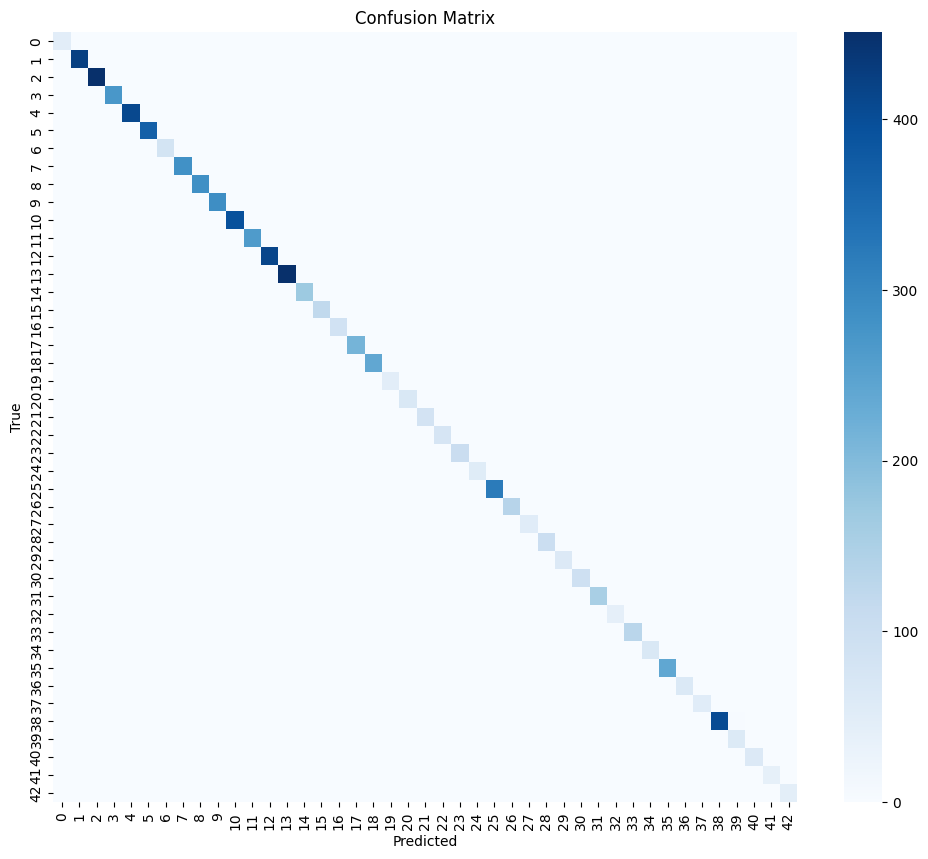

In [ ]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=False, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

### 2.2.2Evaluation of ResNet18 on GTSRB Test Set
The ResNet18 model was evaluated on the official GTSRB test set, which contains 7,842 images across 43 classes. The model achieved an overall accuracy of 99.76%, which shows that it was able to generalize well to unseen data.

The confusion matrix (see Figure X) shows a clear diagonal dominance, which indicates that most of the predicted labels match the ground truth labels. There are almost no visible off-diagonal blocks, which means misclassifications were extremely rare. This is supported by the precision, recall, and F1-scores across all classes being very close to or exactly 1.000.

Notably:

Classes like Stop (class 14), No entry (17), and Speed Limit signs (0–8) were classified with 100% accuracy.

A few minor drops were seen in classes like class 39 (F1 = 0.970) and class 34 (F1 = 0.987), possibly due to smaller support or visual similarity with other signs.

Class 1 (Speed Limit 30 km/h) had the largest sample count (451) and still maintained a perfect recall of 1.000 and F1-score of 0.996.

These results show that ResNet18 was an effective choice for this classification task, especially when combined with data augmentation and proper normalization. It also validates the quality of the preprocessing and the structure of the training pipeline.

In [ ]:
transform_test = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

def predict_image(image_path, model, device):
    model.eval()

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = Image.fromarray(image)
    image_tensor = transform_test(image).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        outputs = model(image_tensor)
        _, predicted = torch.max(outputs.data, 1)

    return predicted.item()

The textual names of the images detected are based on numerical labels. A string variable is used for the class name and is stored when returned.

In [ ]:
def getClassName(classNo):
    class_names = [
        'Speed Limit 20 km/h', 'Speed Limit 30 km/h', 'Speed Limit 50 km/h',
        'Speed Limit 60 km/h', 'Speed Limit 70 km/h', 'Speed Limit 80 km/h',
        'End of Speed Limit 80 km/h', 'Speed Limit 100 km/h', 'Speed Limit 120 km/h',
        'No passing', 'No passing for vechiles over 3.5 metric tons',
        'Right-of-way at the next intersection', 'Priority road', 'Yield', 'Stop',
        'No vehicles', 'Vechiles over 3.5 metric tons prohibited', 'No entry',
        'General caution', 'Dangerous curve to the left', 'Dangerous curve to the right',
        'Double curve', 'Bumpy road', 'Slippery road', 'Road narrows on the right',
        'Road work', 'Traffic signals', 'Pedestrians', 'Children crossing',
        'Bicycles crossing', 'Beware of ice/snow', 'Wild animals crossing',
        'End of all speed and passing limits', 'Turn right ahead', 'Turn left ahead',
        'Ahead only', 'Go straight or right', 'Go straight or left', 'Keep right',
        'Keep left', 'Roundabout mandatory', 'End of no passing',
        'End of no passing by vehicles over 3.5 metric tons'
    ]
    return class_names[classNo]

The path to testing images is noted, and predict_image is used to predict the class of the traffic signs present in the images. A human-readable class name is created using the getClassName function, and the photos are displayed using matplotlib and the model prediction title

Downloading...
From: https://drive.google.com/uc?id=1FoTl86jINdlNJTLaqUlBZm2y2aamn1l0
To: /content/childcross.png
100% 31.2k/31.2k [00:00<00:00, 71.1MB/s]
Predicted Class: 28 --> Children crossing


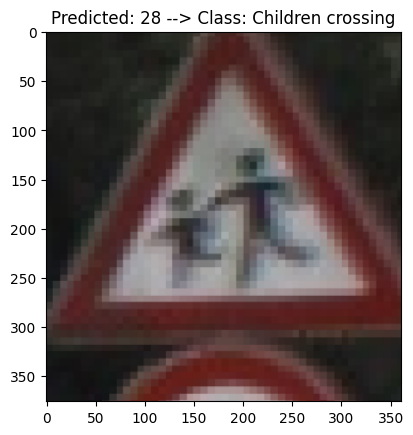

In [ ]:
!gdown --fuzzy "https://drive.google.com/uc?id=1FoTl86jINdlNJTLaqUlBZm2y2aamn1l0"

image_path = '/content/childcross.png'

predicted_class = predict_image(image_path, model, device)

class_name = getClassName(predicted_class)
print(f"Predicted Class: {predicted_class} --> {class_name}")

image = Image.open(image_path)
plt.imshow(image)
plt.title(f"Predicted: {predicted_class} --> Class: {class_name}")
plt.show()

The validation dataset is loaded in the PyTorch pipeline. The data is prepared with a Dataset, and iterating is done in batches through the image data.

In [ ]:
val_dataset = GTSRBDataset(test_images, test_labels, transform=transform_test)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)


The validation dataset is evaluated, and the performance of the trained model is evaluated. Each image's model prediction is obtained, and both predicted and true labels are in separate lists. These are used to calculate the accuracy, prediction, recall, F1-score, and confusion matrix, and the performance of the model is obtained for the unseen images.

In [ ]:

y_true_val = []
y_pred_val = []

model.eval()
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        y_true_val.extend(labels.cpu().numpy())
        y_pred_val.extend(predicted.cpu().numpy())


In [ ]:

accuracy = 100 * np.mean(np.array(y_true_val) == np.array(y_pred_val))
print(f" Test Accuracy: {accuracy:.2f}%\n")

print(" Classification Report:")
print(classification_report(y_true_val, y_pred_val, digits=3))


 Test Accuracy: 95.51%

 Classification Report:
              precision    recall  f1-score   support

           0      1.000     1.000     1.000        60
           1      0.990     0.993     0.992       720
           2      0.995     0.992     0.993       750
           3      0.989     0.964     0.976       450
           4      0.973     0.986     0.980       660
           5      0.941     0.984     0.962       630
           6      1.000     0.893     0.944       150
           7      0.991     0.969     0.980       450
           8      0.978     0.996     0.987       450
           9      0.994     1.000     0.997       480
          10      0.994     0.991     0.992       660
          11      0.935     0.962     0.948       420
          12      0.999     0.977     0.988       690
          13      0.994     0.999     0.997       720
          14      1.000     1.000     1.000       270
          15      1.000     0.957     0.978       210
          16      1.000     0.993

The true labels and predicted labels are used to calculate the confusion matrix. It is displayed by using the seaborn library, and the cell intensity represents the range of colours that fall into a specified combination of the true and predicted labels.

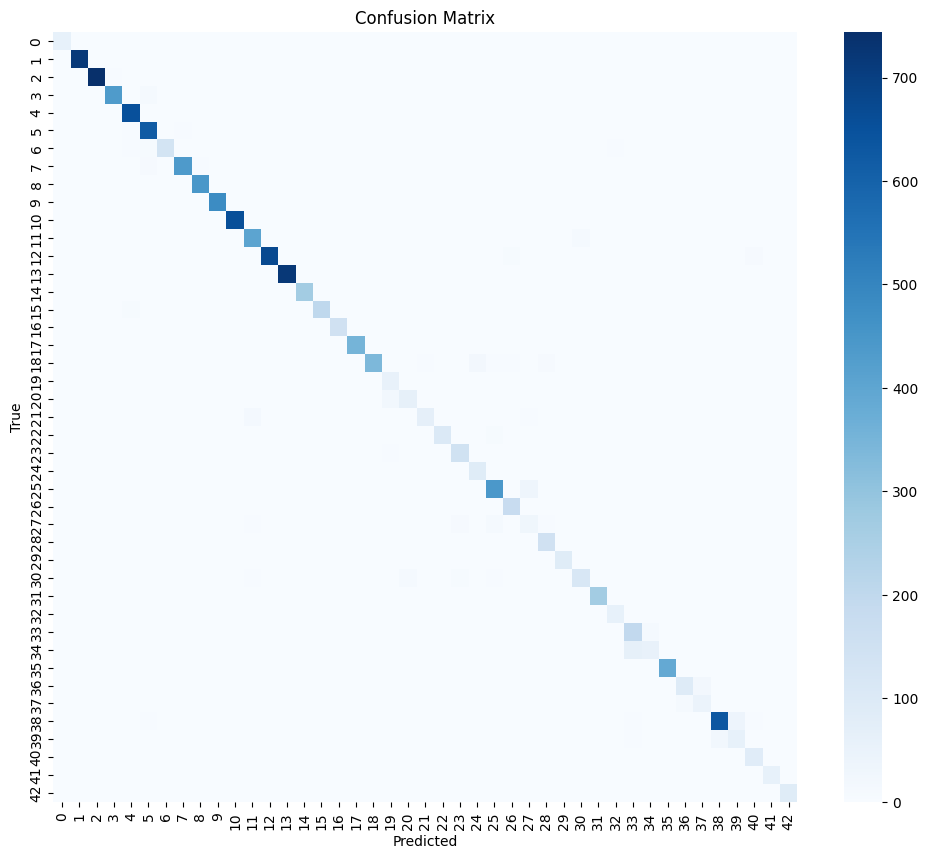

In [ ]:
cm = confusion_matrix(y_true_val, y_pred_val)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=False, cmap='Blues', fmt='d')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [ ]:
testNum = 24
random_indices = random.sample(range(len(test_images)), testNum)


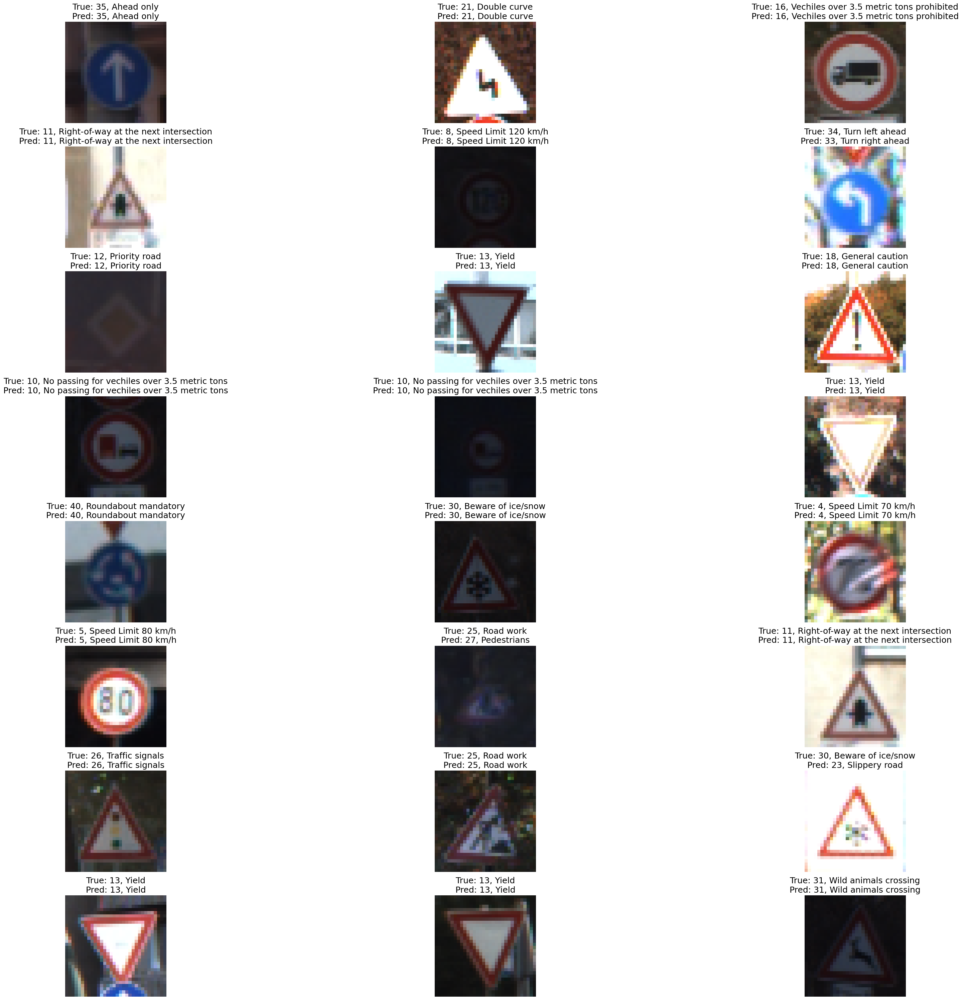

correct: 21 / 24


In [ ]:
correct_count = 0

plt.figure(figsize=(40, 30))

for i, idx in enumerate(random_indices):
    image = test_images[idx]
    label = test_labels[idx]


    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


    image_pil = Image.fromarray(image_rgb)

    image_transformed = transform_test(image_pil)
    image_tensor = image_transformed.unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        _, predicted = torch.max(output, 1)

    pred_label = predicted.item()
    if pred_label == label:
      correct_count += 1


    t_H = testNum//8
    t_V = testNum//t_H
    plt.subplot(t_V, t_H, i+1)
    plt.imshow(image_rgb)
    plt.title(f"True: {label}, {getClassName(label)}\nPred: {pred_label}, {getClassName(pred_label)}", fontsize='18')
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"correct: {correct_count} / {testNum}")


number of cropped trrafic signs: 8
12 -> Priority road


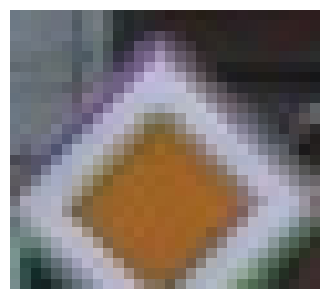

5 -> Speed Limit 80 km/h


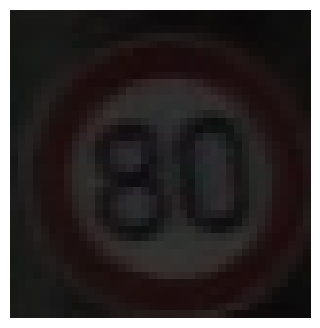

6 -> End of Speed Limit 80 km/h


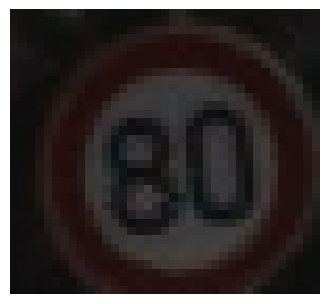

1 -> Speed Limit 30 km/h


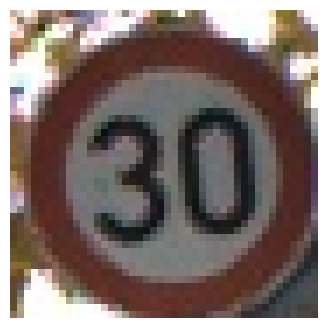

4 -> Speed Limit 70 km/h


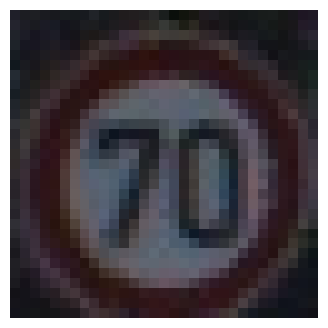

4 -> Speed Limit 70 km/h


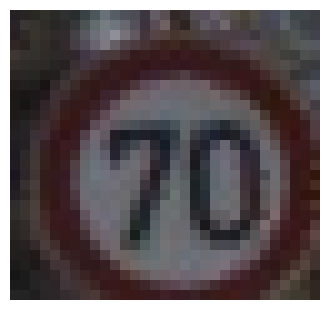

28 -> Children crossing


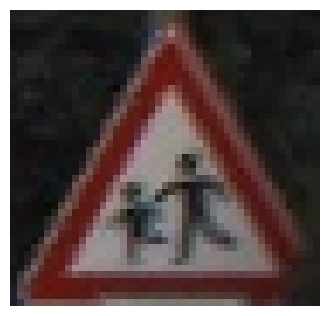

35 -> Ahead only


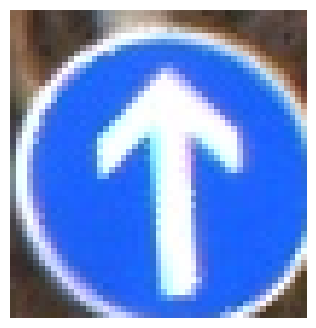

In [ ]:
# use resnet18 model on cropped_trrafic_signs we got from YOLO:

print("number of cropped trrafic signs:", len(cropped_trrafic_signs))

predicted_labels = []

for im in cropped_trrafic_signs:
   image_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
   image_pil = Image.fromarray(image_rgb)
   image_transformed = transform_test(image_pil)
   image_tensor = image_transformed.unsqueeze(0).to(device)

   model.eval()
   with torch.no_grad():
       output = model(image_tensor)
       _, predicted = torch.max(output, 1)

   pred_label = predicted.item()
   predicted_labels.append(pred_label)

for label, im in zip(predicted_labels, cropped_trrafic_signs):
  print(label, "->", getClassName(label))
  show_image(im, size=(4,4))

## 2.3 Traditional ML Models
In addition to using deep learning, we also experimented with several traditional machine learning models to serve as a baseline for comparison. The goal was to evaluate how well classical models perform on the traffic sign classification task using the same GTSRB dataset, but with simpler input representations.

We selected three commonly used classifiers for this:

Support Vector Machine (SVM)

K-Nearest Neighbours (KNN)

Random Forest (RF)

For these models, we flattened the traffic sign images into 1D feature vectors and normalized the pixel values to the [0, 1] range. This approach removes the spatial structure of the image but simplifies the input for traditional classifiers. No data augmentation was used for these models.

These models are generally faster to train and easier to interpret compared to deep neural networks, but they may struggle with generalization, especially on visually similar or low-resolution inputs. Comparing their performance with ResNet18 helped us understand the trade-offs between model complexity and classification accuracy.

### 2.3.1. Support Vector Machine (SVM)
SVM performed quite well in our experiment, achieving over 97% accuracy. It worked especially well for clean, well-aligned traffic sign images with clear edges. This makes sense given that SVM is effective at creating strong decision boundaries in high-dimensional spaces, especially with proper feature scaling.

However, its performance dropped in cases with lighting variation or motion blur. In one test image, it predicted a dim speed limit sign as "Wild animals crossing," likely because the texture resembled the animal symbol under low brightness. This highlights a limitation of SVM: it is sensitive to noise and does not generalize well when pixel-level features shift slightly. Without built-in feature learning, it also can't capture hierarchical patterns the way CNNs can.

SVM is still a strong baseline, especially in tasks with limited data or controlled environments, but for image tasks like this, it shows clear limits.


Data Processing
For the Random Forest (and the other classical models), we used the same images from the GTSRB dataset but changed the input format:

All images were resized to 32×32 pixels

Each image was flattened into a 3072-dimensional vector (32×32×3)

Pixel values were normalized by dividing by 255, scaling them into the [0, 1] range

The dataset was split into training and validation sets using train_test_split() with stratification

Unlike the ResNet18 model, we didn’t apply any augmentation here, because classical models don't benefit from things like rotation or jitter. The point here was to give them a clean, simple version of the task to test their raw predictive power.

The number of cropped traffic signs are printed, after iterating through each predicted label and cropped image. The images are preprocessed and passed through the trained model in order to get the predicted numerical class label. The numerical label for each sign is printed with an explanatory name.

next part: the same detection with SVM model - KNN model - Random Forest model

In [ ]:
!pip install scikit-learn opencv-python numpy

The image data is prepared for machine learning  using SVM. The training and validation sets are loaded and seperated, and then preprocessed by converting to floatig-point number. The pixel values are normalized using a range [0,1] after which the image is flattened into 1D vectors. The model is then evaluated.

In [ ]:
X = train_images_copy
y = train_labels_copy

X_val = np.array(test_images_copy)
y_val = np.array(test_labels_copy)


X = X.astype("float32") / 255.0
X = X.reshape(X.shape[0], -1)

X_val = X_val.astype("float32") / 255.0
X_val = X_val.reshape(X_val.shape[0], -1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

The SVM cclassifier is initialized , which creates an SVC object. Regularization parameter C(10), radial Basis Function(RBF) and gemma(0.01) are used to configure the SCV object created. The SVM model is trained to learn the join between the images and their labels.  The trained classifer is now used to predict new unseen images.

In [ ]:
svm_model = SVC(kernel='rbf', C=10, gamma=0.01)
svm_model.fit(X_train, y_train)

SVC(C=10, gamma=0.01)

The performance of the SVM model on the different classes and the ability of the model to detect  unseen images is generated. digits-4 gives a high level of precision inthe overrall metrics report. It generates an overall accuracy of 0.97.

In [ ]:
y_pred_svm = svm_model.predict(X_test)
print("SVM Classification Report:\n")
print(classification_report(y_test, y_pred_svm, digits=4))

SVM Classification Report:

              precision    recall  f1-score   support

           0     1.0000    0.9762    0.9880        42
           1     0.9458    0.9820    0.9635       444
           2     0.9585    0.9756    0.9670       450
           3     0.9516    0.9752    0.9632       282
           4     0.9282    0.9798    0.9533       396
           5     0.9571    0.9597    0.9584       372
           6     1.0000    0.9881    0.9940        84
           7     0.9962    0.9097    0.9510       288
           8     0.9643    0.9574    0.9609       282
           9     0.9829    0.9796    0.9813       294
          10     0.9925    0.9826    0.9875       402
          11     0.9424    0.9924    0.9668       264
          12     0.9765    0.9905    0.9835       420
          13     0.9792    0.9815    0.9803       432
          14     1.0000    0.9808    0.9903       156
          15     0.9837    0.9603    0.9719       126
          16     0.9767    1.0000    0.9882        84

In [ ]:
y_pred_val_svm = svm_model.predict(X_val)
print("SVM Classification Report:\n")
print(classification_report(y_val, y_pred_val_svm, digits=4))

### 2.3.2. K-Nearest Neighbours
KNN had the lowest overall performance among the models tested, with around 86% accuracy. While it's simple and intuitive—predicting based on the “closest” examples in the training set—this simplicity becomes a weakness in high-dimensional input like images.

Because our images were flattened into 3072-dimension vectors, the distance metric (Euclidean by default) becomes less meaningful. Even with normalization, slight changes in color or rotation heavily affect distance, leading to misclassifications. KNN was particularly vulnerable in cases of dark or blurry images.

That said, KNN can still be useful in small-scale systems or in tasks where interpretability is important, since it’s easy to explain why a decision was made (“it's like these samples”). But for visual recognition, it doesn’t scale well and suffers in both speed and accuracy.

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

In [ ]:
y_pred_knn = knn_model.predict(X_test)
print("KNN Classification Report:\n")
print(classification_report(y_test, y_pred_knn, digits=4))

In [ ]:
y_pred_val_knn = knn_model.predict(X_val)
print("KNN Classification Report:\n")
print(classification_report(y_val, y_pred_val_knn, digits=4))

### 2.3.3 Random Forest with Flattened RGB
Random Forest gave the best performance among the traditional models, especially when used with HOG features. Its ensemble structure—combining many decision trees—allowed it to make more robust decisions even on slightly noisy or occluded images. With HOG, the accuracy jumped to over 92%, showing that handcrafted features still matter when using classical models.

One of the key advantages of RF is its ability to handle mixed data, resist overfitting, and provide some interpretability (via feature importance). It was more consistent than SVM and clearly more stable than KNN.

However, RF still has limits compared to deep learning. It relies heavily on feature quality, and its performance drops sharply if the input features are noisy or poorly structured. In our test, it struggled with signs under heavy shadow or off-angle shots. It also lacks the ability to adapt or learn new features beyond what was given.

Overall, Random Forest is a solid choice when computational resources are limited or fast prototyping is needed, but not a replacement for a CNN when precision in complex settings matters.

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

In [ ]:
y_pred_rf = rf_model.predict(X_test)
print("Random Forest Classification Report:\n")
print(classification_report(y_test, y_pred_rf, digits=4))

In [ ]:
y_pred_val_rf = rf_model.predict(X_val)
print("Random Forest Classification Report:\n")
print(classification_report(y_val, y_pred_val_rf, digits=4))

### 2.3.4Traditional Classifier Performance: Analysis & Discussion
* Random Forest achieved the best overall results across all metrics, with 98.01% accuracy and an F1-score of 0.980. This shows that the ensemble nature of Random Forest helped the model capture both low-level color information and high-level class boundaries, even without handcrafted features like HOG. It also tends to generalize better and handle class imbalance more effectively than KNN or SVM in this setup.

* SVM delivered strong results, with an F1-score of 0.971, slightly below Random Forest. It performed well on frequent and well-separated classes but likely struggled on borderline cases or visually ambiguous signs due to its reliance on a single optimal hyperplane. While its precision is high (0.981), the lower recall (0.961) suggests that it missed more true positives than Random Forest.

* KNN was clearly the weakest performer here, with only 86.7% accuracy and an F1-score of 0.875. This is expected given that KNN is sensitive to noise, class imbalance, and the curse of dimensionality (especially with 3072-dim input). It also lacks an internal learning process—making it less suitable for high-dimensional image classification tasks like this.

In [ ]:
def print_scores(name, y_true, y_pred):
    print(f"\n{name} Scores:")
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, average='macro'))
    print("Recall:", recall_score(y_true, y_pred, average='macro'))
    print("F1 Score:", f1_score(y_true, y_pred, average='macro'))


In [ ]:
print_scores("SVM", y_test, y_pred_svm)
print_scores("KNN", y_test, y_pred_knn)
print_scores("Random Forest", y_test, y_pred_rf)



SVM Scores:
Accuracy: 0.9719459321601632
Precision: 0.9818898698444081
Recall: 0.9608697694599629
F1 Score: 0.9706814122339458

KNN Scores:
Accuracy: 0.8668706962509564
Precision: 0.8906634688357545
Recall: 0.865305967921653
F1 Score: 0.8749450961722697

Random Forest Scores:
Accuracy: 0.9801071155317521
Precision: 0.9873153580395574
Recall: 0.974240802832613
F1 Score: 0.9804203972056676


In [ ]:
print_scores("SVM", y_val, y_pred_val_svm)
print_scores("KNN", y_val, y_pred_val_knn)
print_scores("Random Forest", y_val, y_pred_val_rf)



SVM Scores:
Accuracy: 0.7095803642121932
Precision: 0.7207090012602845
Recall: 0.5962089205499215
F1 Score: 0.6294495296141221

KNN Scores:
Accuracy: 0.3809184481393508
Precision: 0.38178859059765335
Recall: 0.3282682066089549
F1 Score: 0.33780375714141375

Random Forest Scores:
Accuracy: 0.7695170229612035
Precision: 0.7755578741292353
Recall: 0.66868836564514
F1 Score: 0.6928349124492255


### 2.3.5.Random Forest with HOG Features
In this part, we tested the trained Random Forest model on the official GTSRB test set using HOG features. All test images were resized to 64×64 and converted to grayscale before feature extraction. We used the same HOG parameters as in training: 9 orientations, 8×8 pixel cells, and 2×2 blocks. The extracted features were passed to the saved Random Forest model for prediction.

The predicted results were evaluated using standard metrics like accuracy, precision, recall, F1-score, and confusion matrix. This test helps confirm whether the model generalizes well to unseen traffic signs.

All test code was run in the same environment, and the model file was loaded from the shared project folder. No changes were made to the original dataset structure.



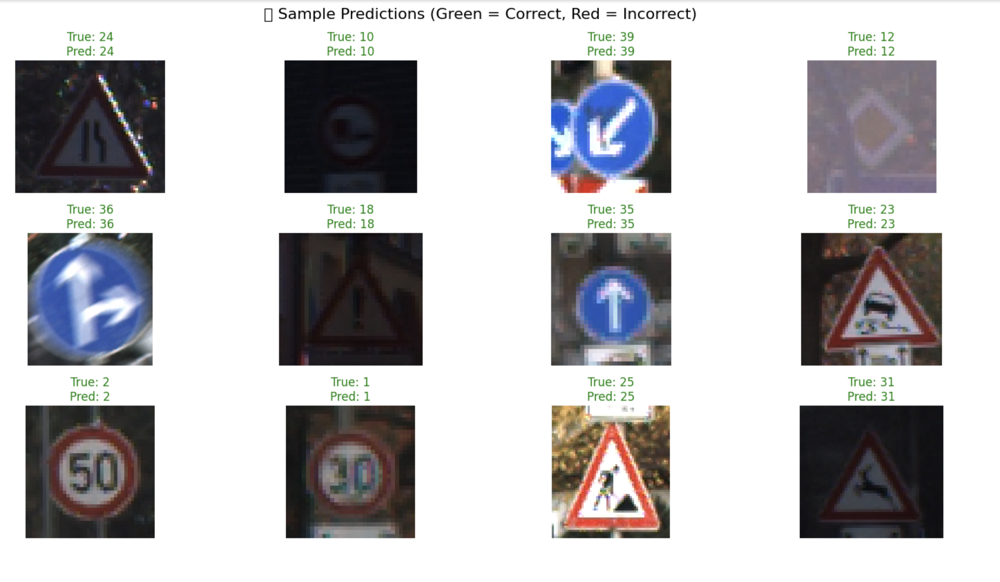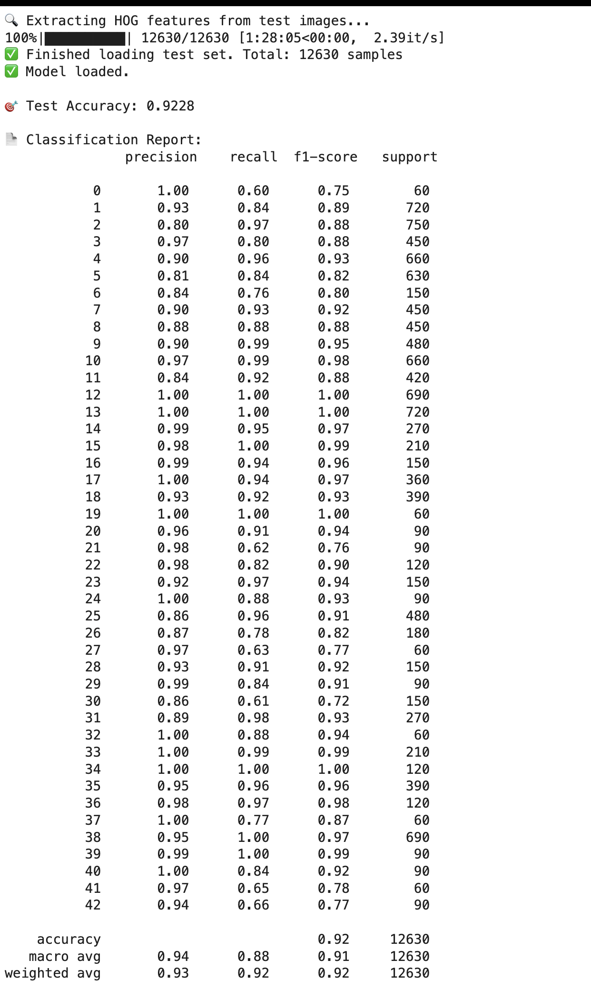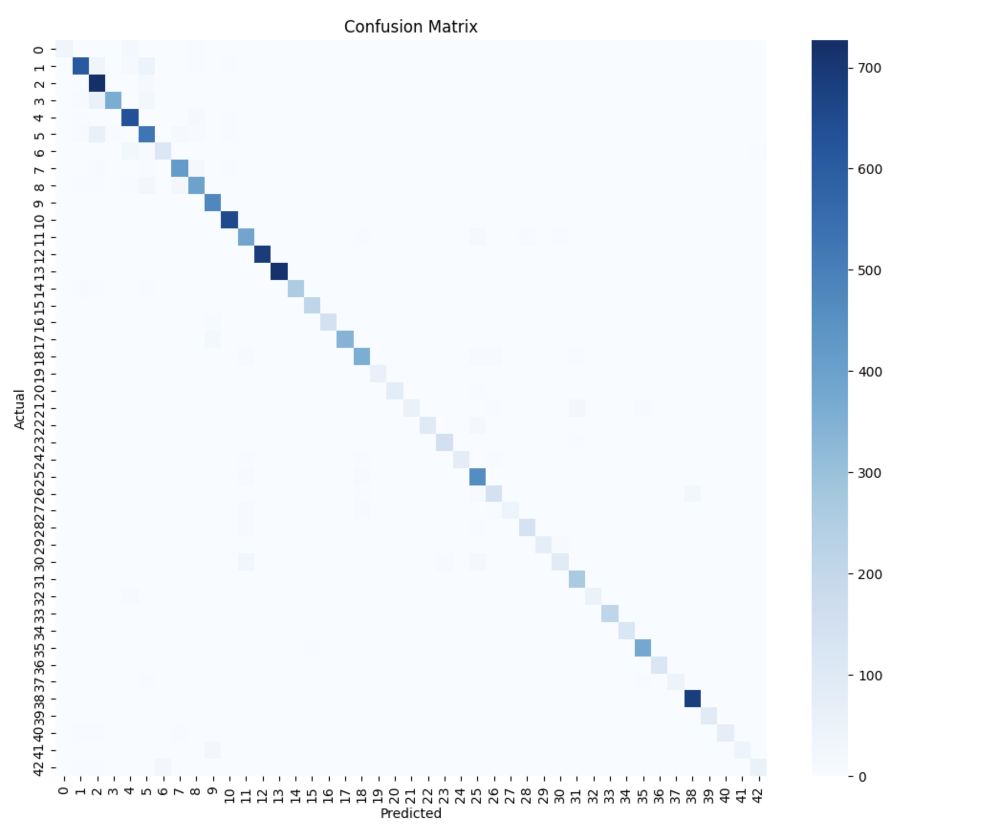

Due to the longer processing time and large dataset size, the full evaluation of the HOG + Random Forest classifier was conducted separately in an external notebook. In this run, we extracted HOG features from 12,630 test images in the GTSRB test set and used the previously saved model for inference.

The final accuracy achieved was 92.28%, which is a strong result for a classical machine learning approach using handcrafted features.

Some observations from the classification report:

Perfect scores (F1 = 1.00) were achieved for several classes, such as Class 12 (Priority road), Class 13 (Yield), and Class 34 (Turn right).

Lower performance was observed in some challenging or less frequent classes like Class 0 (Speed Limit 20 km/h, F1 = 0.75) and Class 30 (Beware of ice/snow, F1 = 0.72), which often have fewer examples or more visual similarity to others.

The model generally performed better on high-frequency and shape-distinct signs.

While the model didn’t outperform the ResNet18 deep learning model, the result confirms that combining HOG features with a Random Forest classifier can still achieve strong performance, especially when computational resources are limited.

This experiment was not part of the main pipeline but was conducted as an extension to further explore feature engineering in traditional machine learning.



### 2.3.6. DIsscussion
Overall, these results confirm that not all traditional classifiers are equally suitable for visual classification, even when fed the same data. Random Forest performed surprisingly well, likely due to its ability to ensemble over noisy pixel-level features. SVM worked better than expected but had some trade-offs in recall. KNN, while easy to implement, underperformed and would likely benefit from dimensionality reduction or feature engineering (e.g., using HOG).

These results also serve as a baseline for comparing with our deep learning model (ResNet18), which outperformed all three in both accuracy and class-level consistency. However, Random Forest remains a valid option for low-resource settings where model size and training time are more important than raw performance.




## 2.4.Model Training and Loading Strategy
To keep the workflow modular and efficient, all models used in this project were trained in separate notebooks or scripts, and then saved for later evaluation. This includes:

The ResNet18 classifier (trained on GTSRB)

The Random Forest classifiers (with both flattened RGB and HOG features)

The traditional models such as SVM and KNN

Each model was saved using either torch.save() (for PyTorch models) or joblib.dump() (for scikit-learn models). In the main notebook, we simply load the trained models and use them to run predictions on the test set. This approach helps reduce the runtime of the final report notebook and makes the system easier to maintain and debug.

It also allows for independent testing of different model variations, without interfering with the deep learning pipeline or the video processing steps.

load the models:

In [ ]:
!gdown --fuzzy "https://drive.google.com/uc?id=1btfabc9G_DFct9MX7XFpiDYzfevzTqqP" -O svm_model.pkl
!gdown --fuzzy "https://drive.google.com/uc?id=1--7yQUVX5Er_nWLpcAHV5LT9oBTYHbLL" -O knn_model.pkl
!gdown --fuzzy "https://drive.google.com/uc?id=1-9HrApW_GAyP3DtatilIJXrGluGcpAUr" -O rf_model.pkl


In [ ]:
with open('/content/svm_model.pkl', 'rb') as f:
    svm_model = pickle.load(f)

In [ ]:
with open('/content/knn_model.pkl', 'rb') as f:
    knn_model = pickle.load(f)

In [ ]:
with open('/content/rf_model.pkl', 'rb') as f:
    rf_model = pickle.load(f)

In [ ]:
num_samples = 10
indices = random.sample(range(len(X_test)), num_samples)

X_test_sample = X_test[indices]
y_true_test_sample = y_test[indices]


In [ ]:
y_pred_test_sample_svm = svm_model.predict(X_test_sample)
y_pred_test_sample_knn = knn_model.predict(X_test_sample)
y_pred_test_sample_rf = rf_model.predict(X_test_sample)

## 2.5.Qualitative Comparison of Traditional Models
To better understand how the traditional classifiers behave, we visualized a selection of test images along with their true labels and the predictions made by SVM, KNN, and Random Forest. The examples include both correct predictions and failure cases.

In the majority of cases, all three models correctly predicted the class. For instance, in the top-left example (Class 4 – Speed Limit 70 km/h), all models returned the correct label. Similarly, signs like Speed Limit 120, No Passing, and End of No Passing were also consistently predicted across models.

However, there were some notable failure cases:

In the second row, second column, KNN misclassified Class 2 (Speed Limit 50 km/h) as Class 3 (Speed Limit 60 km/h), possibly due to similarity in color and shape.

In the second row, first column, SVM misclassified Class 7 (Speed Limit 100 km/h) as Class 31 (Wild animals crossing), likely caused by low brightness and motion blur.

In some dark or low-contrast images, Random Forest was more stable compared to KNN, which was more sensitive to pixel-level noise.

These visual examples confirm that Random Forest is generally more robust, especially under poor lighting conditions, while KNN is more vulnerable to slight visual variations. SVM occasionally overfits to visual textures, leading to misclassification in distorted images.

This qualitative check complements the numerical evaluation and gives a clearer picture of where each model succeeds or fails.

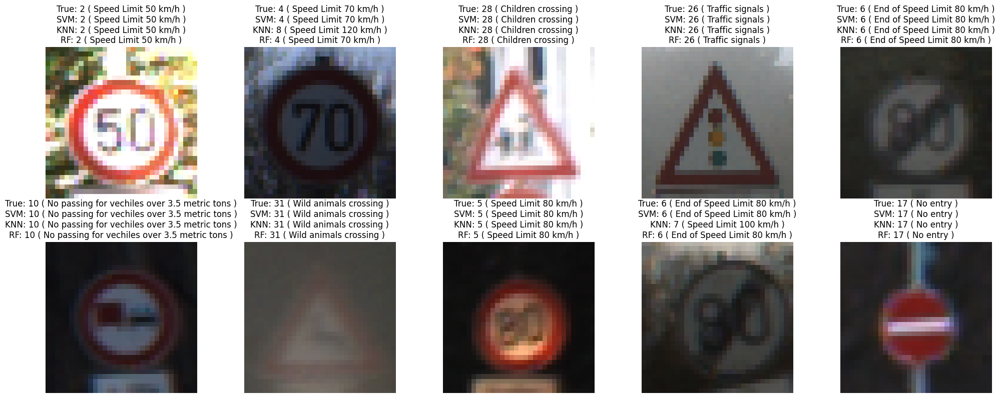

In [ ]:
plt.figure(figsize=(20, 8))

for i in range(len(X_test_sample)):
    true_label = y_true_test_sample[i]
    pred_svm = y_pred_test_sample_svm[i]
    pred_knn = y_pred_test_sample_knn[i]
    pred_rf = y_pred_test_sample_rf[i]

    img_flat = X_test_sample[i]
    img = img_flat.reshape(32, 32, 3)

    img_display = (img * 255).clip(0, 255).astype(np.uint8)
    img_display = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)

    # Show image
    plt.subplot(2, 5, i+1)
    plt.imshow(img_display)
    plt.axis('off')
    plt.title(f"True: {true_label} ( {getClassName(true_label)} )\n"
              f"SVM: {pred_svm} ( {getClassName(pred_svm)} )\n"
              f"KNN: {pred_knn} ( {getClassName(pred_knn)} )\n"
              f"RF: {pred_rf} ( {getClassName(pred_rf)} )", fontsize=12)

plt.tight_layout()
plt.show()


A sample of the image data validation and their true labels are created, and the image data is retrived

In [ ]:
X_val_sample = X_val[indices]
y_true_val_sample = y_val[indices]


In [ ]:
y_pred_val_sample_svm = svm_model.predict(X_val_sample)
y_pred_val_sample_knn = knn_model.predict(X_val_sample)
y_pred_val_sample_rf = rf_model.predict(X_val_sample)

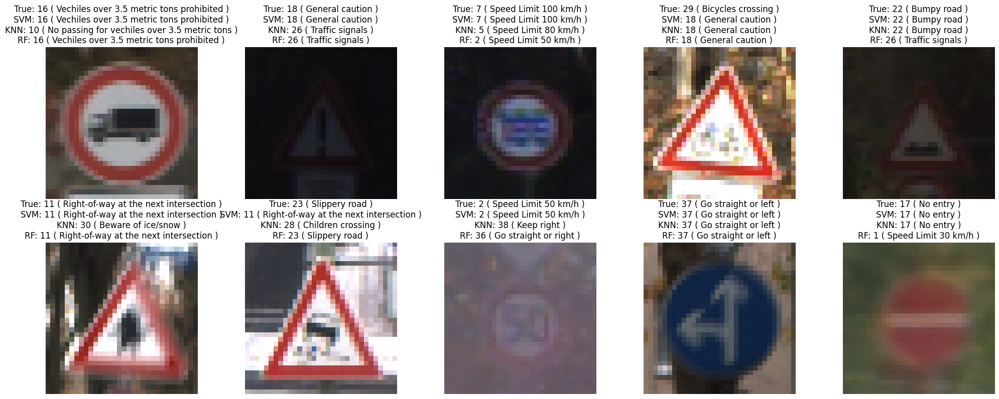

In [ ]:
plt.figure(figsize=(20, 8))

for i in range(len(X_val_sample)):
    true_label = y_true_val_sample[i]
    pred_svm = y_pred_val_sample_svm[i]
    pred_knn = y_pred_val_sample_knn[i]
    pred_rf = y_pred_val_sample_rf[i]

    img_flat = X_val_sample[i]
    img = img_flat.reshape(32, 32, 3)

    img_display = (img * 255).clip(0, 255).astype(np.uint8)
    img_display = cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB)

    # Show image
    plt.subplot(2, 5, i+1)
    plt.imshow(img_display)
    plt.axis('off')
    plt.title(f"True: {true_label} ( {getClassName(true_label)} )\n"
              f"SVM: {pred_svm} ( {getClassName(pred_svm)} )\n"
              f"KNN: {pred_knn} ( {getClassName(pred_knn)} )\n"
              f"RF: {pred_rf} ( {getClassName(pred_rf)} )", fontsize=12)

plt.tight_layout()
plt.show()


## 2.6. Video Testing and Deployment
To evaluate how our system performs outside of the dataset, we tested it on a real-world traffic video. The video was recorded manually at a road junction near the Lansdowne campus in Bournemouth, using a mobile phone. The footage included a variety of traffic signs under normal lighting and slight movement.

We processed the video frame by frame. For each frame:

YOLOv8 was used to detect any traffic signs present.

Detected regions were cropped and resized.

The cropped signs were passed to our trained ResNet18 classifier to predict the class.

The predicted label was overlaid on the original frame using OpenCV.

All annotated frames were exported as a new .mp4 video.

The output video clearly shows that the system can detect and classify signs in continuous video streams. Most predictions were correct, although a few signs at extreme angles or partial occlusions were either missed or misclassified.

Overall, this test shows that our pipeline is not just limited to static images, but also works in more realistic, uncontrolled environments.

In [ ]:
# Downloading the test video recorded at the Lansdowne Roundabout in Bournemouth, Dorset, UK:
!gdown --fuzzy "https://drive.google.com/uc?id=1c5gnNuZj3pnW50sn0J5MtXEHG25qccHu"


mov_video_path = "/content/video_test.mp4"
mp4_video_path = "/content/converted_video.mp4"

if os.path.exists(mov_video_path):
    print("Converting .mov to .mp4 (with overwrite)...")
    try:
        subprocess.run(
            ["ffmpeg", "-y", "-i", mov_video_path, "-vcodec", "libx264", "-acodec", "aac", mp4_video_path],
            check=True,
            stdout=subprocess.PIPE,
            stderr=subprocess.PIPE
        )
        print("Conversion complete:", mp4_video_path)
        video_path = mp4_video_path
    except subprocess.CalledProcessError as e:
        print("FFmpeg conversion error:")
        print(e.stderr.decode())
        video_path = mov_video_path  # fallback
else:
    print("Using uploaded .mov directly")
    video_path = mov_video_path


# Load Models
!gdown --fuzzy "https://drive.google.com/uc?id=1hPKc-xkz9dQoH6xaNaUqQ7dWZzhf6qwu"
yolo_weights = "/content/yolo_gtsdb_detector/weights/best.pt"

!gdown --fuzzy "https://drive.google.com/uc?id=1pw1X50KZfO5nws8SNKFm0P1OfwdDbcDa"
resnet_weights = "/content/gtsrb_model_resnet18.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Load YOLOv5 model
model_yolo = YOLO(yolo_weights)

# Load ResNet classifier
model_resnet = resnet18(pretrained=False)
model_resnet.fc = torch.nn.Linear(model_resnet.fc.in_features, 43)
model_resnet.load_state_dict(torch.load(resnet_weights, map_location=device))
model_resnet = model_resnet.to(device)
model_resnet.eval()


# Preprocessing pipeline for ResNet
transform_classifier = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

def adjust_gamma(image, gamma=1.8):
    invGamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(256)]).astype("uint8")
    return cv2.LUT(image, table)

def classify_crop(image_crop):
    try:
        tensor = transform_classifier(image_crop).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model_resnet(tensor)
            pred = output.argmax(dim=1).item()
            probs = torch.nn.functional.softmax(output, dim=1)
            confidence = probs[0][pred].item()
        return pred, confidence
    except Exception as e:
        print(" ResNet error:", e)
        return None, None

frames = []
cap = cv2.VideoCapture(video_path)
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Enhance red channel and contrast
    frame[:, :, 2] = cv2.equalizeHist(frame[:, :, 2])
    frame = adjust_gamma(frame, gamma=1.8)
    frames.append(frame)
cap.release()
print(f"Extracted {len(frames)} frames from video")



🔄 Converting .mov to .mp4 (with overwrite)...


  warnings.warn(

  warnings.warn(msg)



Conversion complete: /content/converted_video.mp4
Using device: cuda
Extracted 292 frames from video


In [ ]:
out_frames = []
for idx, frame in enumerate(frames):
    results = model_yolo(frame, conf=0.01, iou=0.1, verbose=False)[0]
    boxes = results.boxes

    for box in boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        crop = frame[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        label, conf = classify_crop(crop)
        if label is not None:
            label_name = getClassName(label)
            label_text = f"{label_name} ({conf:.2f})"
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, label_text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    cv2.putText(frame, f"Frame {idx+1}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    out_frames.append(frame)

output_clip = ImageSequenceClip([cv2.cvtColor(f, cv2.COLOR_BGR2RGB) for f in out_frames], fps=10)
output_path = "/content/traffic_sign_detected_resnet.mp4"
output_clip.write_videofile(output_path, codec="libx264")
print("Final annotated video saved to:", output_path)


Moviepy - Building video /content/traffic_sign_detected_resnet.mp4.
Moviepy - Writing video /content/traffic_sign_detected_resnet.mp4



Moviepy - Done !
Moviepy - video ready /content/traffic_sign_detected_resnet.mp4
Final annotated video saved to: /content/traffic_sign_detected_resnet.mp4


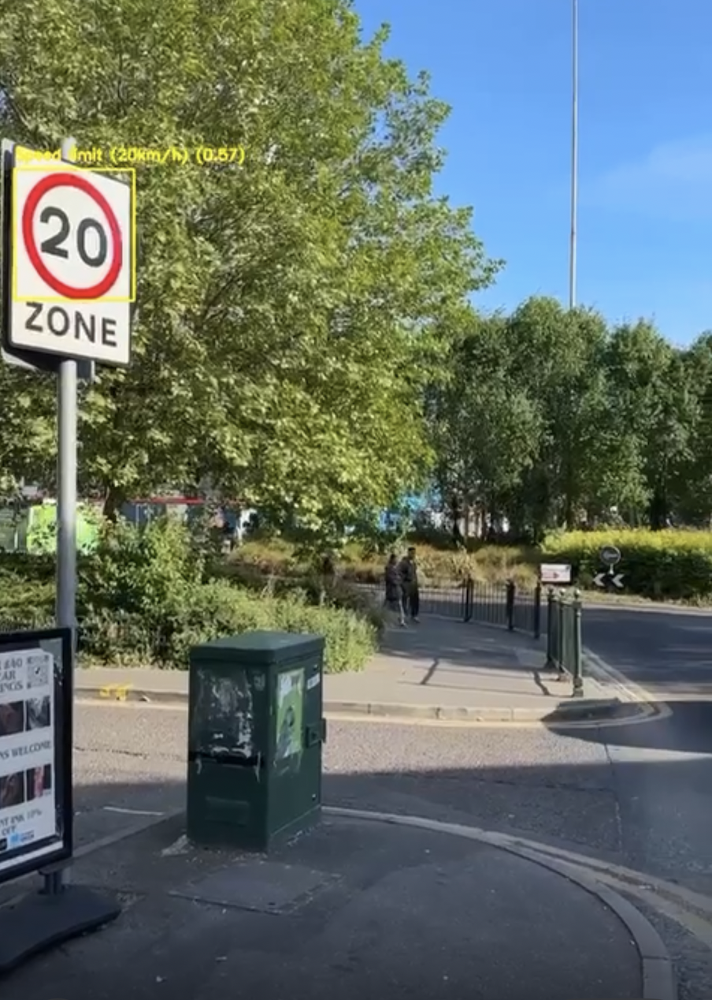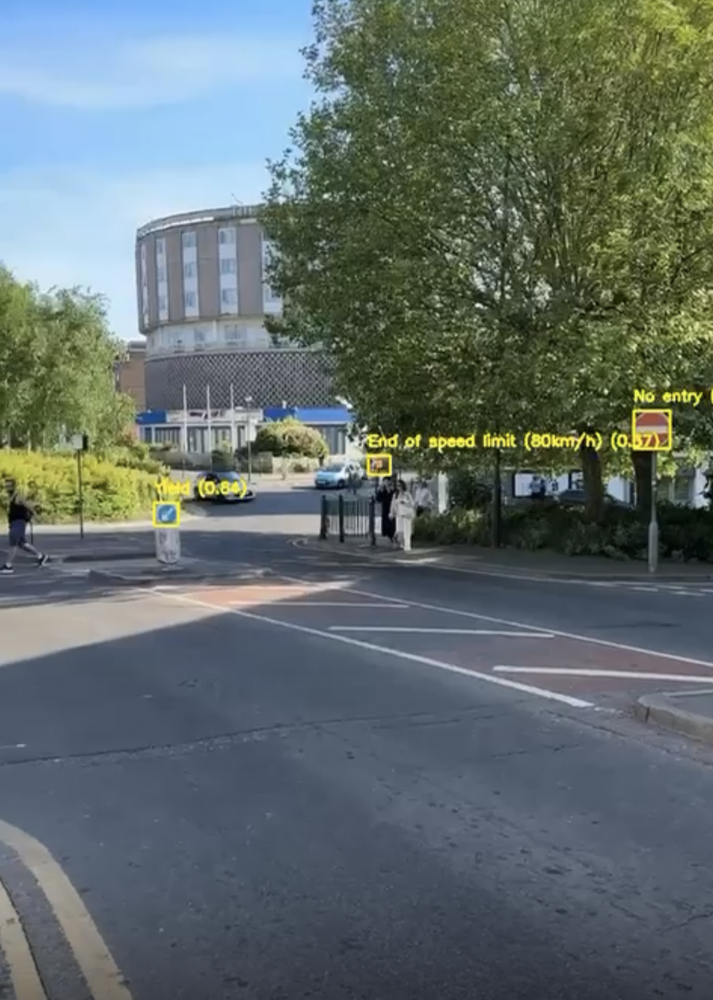

## 3.Discussion
During testing, we observed that lighting conditions had a clear impact on classification performance—especially for traditional models. In darker frames or under shadow, the raw pixel-based inputs became less reliable, which led to misclassifications, particularly for KNN and SVM. Random Forest was slightly more stable, likely due to its ensemble nature.

The deep learning model (ResNet18) showed much better robustness in these low-light or noisy conditions. It was able to correctly classify signs even when they were slightly blurred, dimly lit, or partially occluded. This highlights the advantage of feature learning over handcrafted features in complex environments.

We also compared two types of features for Random Forest: flattened RGB vectors and HOG descriptors. The HOG version consistently outperformed the raw pixel version, showing that even classical models can benefit from better feature engineering. However, it still did not match the performance of ResNet18, especially in terms of generalization across varying conditions.

These results suggest that deep learning is more suitable for real-world deployment, while traditional models—although fast and lightweight—are better used for baseline comparison or in controlled environments.

## 4.Conclusion
This project successfully built a full pipeline for traffic sign detection and recognition using a combination of YOLOv8 for object detection and ResNet18 for classification. We also implemented several traditional classifiers, including SVM, KNN, and Random Forest, to serve as baseline comparisons.

Among all the models tested, ResNet18 achieved the highest accuracy and handled real-world data more reliably. Random Forest came close in some cases but was less consistent in more challenging visual conditions.

We also tested our system on a real video recorded in Bournemouth. The results showed that the pipeline generalizes reasonably well and can be extended to more complex driving scenarios.

In the future, improvements could include using multi-scale training, low-light enhancement techniques, and real-time deployment optimization. Exploring other deep models such as MobileNet or Vision Transformers could also offer better performance with fewer computational resources.

## References
* Houben, S., Stallkamp, J., Salmen, J., Schlipsing, M. and Igel, C. (2013) ‘Detection of traffic signs in real-world images: The German Traffic Sign Detection Benchmark’, Proceedings of the International Joint Conference on Neural Networks (IJCNN), pp. 1–8.

* Stallkamp, J., Schlipsing, M., Salmen, J. and Igel, C. (2011) ‘The German Traffic Sign Recognition Benchmark: A multi-class classification competition’, IEEE International Joint Conference on Neural Networks, pp. 1453–1460.

* Ultralytics (2023) YOLOv8: Real-Time Object Detection. Available at: https://github.com/ultralytics/ultralytics (Accessed: 14 May 2025).

* German Traffic Sign Recognition Benchmark. Available at: https://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset (Accessed: 14 May 2025).

* German Traffic Sign Detection Benchmark. Available at: https://benchmark.ini.rub.de/?section=gtsdb&subsection=dataset (Accessed: 14 May 2025).

* Pedregosa, F. et al. (2011)
‘Scikit-learn: Machine Learning in Python’, Journal of Machine Learning Research, 12, pp. 2825–2830.

* Bradski, G. (2000)
‘The OpenCV Library’, Dr. Dobb’s Journal of Software Tools.



